![AnalyseDesDonnees](pics/AtelierPignon.png)

# <center>Project 2: Voluntary. Analysis of the Atelier Pignon database</center>  
  
## <center>Bénévole. Analyse de la base de données de l'Atelier Pignon</center>  

# 0. Problem Statement and Data Familiarization  
**Project Description**  
The Atelier du Pignon, a bicycle repair association of the city of Nantes, which provides assistance, tools and spare parts for self-repair and maintenance of bicycles in exchange for an annual membership fee, wishes to analyze the composition of its members. **The project is voluntary and free of charge**.  
  
**Business Objective**  
Determine the relationship between the data that participants agreed to provide about themselves (community of residence, gender, age, volunteer status) and the amount of their membership fee.

**Technical Task for Data Scientist**  
Analyze databases for the years 2023-2024 and 2024-2025, illustrate hypotheses and conclusions about the composition of Atelier members, and answer the questions posed. In the final part of the project, solve the Data Science task to determine the gender of the participants who did not specify it for any reason.  

**Main objectives of the project:**
1. Perform preprocessing and exploratory analysis of the Atelier real data set (handle missing data, duplicates and outliers, eliminate input errors, find patterns, generate new features using external sources).
2. Answer questions about the dependence of the amount of annual fee on other factors.  
3. Compare the dynamics of participant registrations for the same period in 2023-2024 and 2024-2025.  
4. Build several machine learning models, perform predictions of the gender of Atelier participants who did not specify it, and select the best model based on the target metric.  
5. Prepare a pdf report with the results of the analysis and prediction.  
  
  

### [RU version] Постановка задачи и Знакомство с данными  
**Описание проекта**  
Ассоциация по ремонту велосипедов города Нанта Atelier du Pignon, предоставляющая помощь, инструменты и запасные части для самостоятельного ремонта и обслуживания велосипедов в обмен на годовой членский взнос, желает проанализировать состав участников ателье. Проект выполняется на добровольной и безвозмездной основе.    

**Бизнес-задача**  
Определить взаимосвязь данных об участниках, которые они согласились указать о себе (коммуна проживания, пол, возраст, статус добровольца), и размера их членского взноса.

**Техническая задача для специалиста Data Science**  
Проанализировать базы данных за 2023-2024 и 2024-2025 годы, проиллюстрировать гипотезы и выводы о составе участников ателье, ответить на поставленные вопросы. В финальной части проекта решить задачу Data Science по определению пола участников, которые его по какой-либо причине не указали.  

**Основные цели проекта:**
1. Произвести предобработку и разведывательный анализ набора реальных данных Ателье (обработать пропуски, дубликаты и выбросы, устранить ошибки ввода, отыскать закономерности, сгенерировать новые признаки с использованием внешних источников).
2. Ответить на вопросы о зависимости суммы ежегодного взноса от других факторов.  
3. Сравнить динамику регистраций участников за аналогичный период 2023-2024 и 2024-2025 годов.  
4. Построить несколько моделей машинного обучения, выполнить прогнозироз пола участников Ателье, которые не указали его, и отобрать лучшую модель по целевой метрике.  
5. Подготовить pdf-отчет с результатами анализа и предсказания.  

In [1]:
import pandas as pd
import numpy as np
import datetime
import geojson
import copy

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
%matplotlib inline

import plotly.io as pio # Для отображения OpenStreetMaps нужно сменить рендерер
pio.renderers.default = 'notebook'
# pio.renderers.default = 'vscode' # этот установлен по умолчанию

from sklearn.preprocessing import LabelEncoder, MinMaxScaler, Normalizer, StandardScaler
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn import linear_model, tree, ensemble, metrics

In [2]:
# Зададим константы
# geojson.geometry.DEFAULT_PRECISION = 6 # Точность координат geojson-файлов по умолчанию
MIN_YEAR = 1930
MAX_YEAR = 2010
NANTES_QUARTIERS = {44000: ['Centre Ville', 'Hauts Pavés - Saint Félix', 'Malakoff - Saint-Donatien'],
                    44100: ['Bellevue - Chantenay - Sainte Anne', 'Dervallières - Zola'],
                    44200: ['Ile de Nantes', 'Nantes Sud'],
                    44300: ['Breil - Barberie', 'Nantes Nord', 'Nantes Erdre', 'Doulon - Bottière']}

INSEE_ID_LIST = dict(zip(NANTES_QUARTIERS.keys(), [44900, 44109, 44209, 44309]))
MONTHS_LIST = ['', 'Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
ATELIER_COORDS = {'lat': 47.211309, 'lon': -1.542032}

RANDOM_SEED = 42
SAVE_TO_FILES = False

GENRE_COLORS = {'H': '#a6cee3', 'F': '#1f78b4', 'X': '#b2df8a'}

Colors corresponding to three genders:  
H - F - X 
   
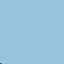 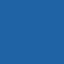 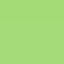

In [109]:
df = pd.read_excel('data/Données-23-24.xlsx')
df.head()

,Numéro,Date de naissance,Genre (F/H/X),CP,Bénévoles (x),Montant de l’adhésion,Date d'inscription
0,1,1990-04-28 00:00:00,H,44000,X,40,2023-08-21
1,2,1962-04-18 00:00:00,H,44100,NaN,40,2023-08-21
2,3,1980-04-07 00:00:00,H,44200,NaN,10,2023-08-21
3,4,2001-03-05 00:00:00,H,44200,NaN,RENOUVELLEMENT,2023-08-21
4,5,1996-04-13 00:00:00,F,44400,X,20,2023-08-21


In [110]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 979 entries, 0 to 978
Data columns (total 7 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   Numéro                 979 non-null    int64         
 1   Date de naissance      953 non-null    object        
 2   Genre (F/H/X)          971 non-null    object        
 3   CP                     968 non-null    object        
 4   Bénévoles (x)          40 non-null     object        
 5   Montant de l’adhésion  978 non-null    object        
 6   Date d'inscription     978 non-null    datetime64[ns]
dtypes: datetime64[ns](1), int64(1), object(5)
memory usage: 53.7+ KB


In [111]:
# Упростим названия признаков
df.columns = ['ID', 'Naissance', 'Genre', 'CP', 'Bénévole', 'Montant', 'Inscription']
df.head()

,ID,Naissance,Genre,CP,Bénévole,Montant,Inscription
0,1,1990-04-28 00:00:00,H,44000,X,40,2023-08-21
1,2,1962-04-18 00:00:00,H,44100,NaN,40,2023-08-21
2,3,1980-04-07 00:00:00,H,44200,NaN,10,2023-08-21
3,4,2001-03-05 00:00:00,H,44200,NaN,RENOUVELLEMENT,2023-08-21
4,5,1996-04-13 00:00:00,F,44400,X,20,2023-08-21


# 1. Data cleansing  
## 1.1. Processing the Naissance feature  
Let's extract three new attributes: year, month and date of birth.  
When working with the year, we will proceed as follows:  
1. Int will be converted to datetime by adding the first missing digits of the century (1900).  
2. Str will be converted to datetime, where there are digits.  
3. All the rest will be of type NaN or None.  
4. In those records where the month and year are not specified, we will substitute January 1 (there are about 50 such records).  

In [112]:
df['Naissance'].apply(type).value_counts()

<class 'datetime.datetime'>    907
<class 'int'>                   42
<class 'float'>                 26
<class 'str'>                    4
Name: Naissance, dtype: int64

### 1.1.1. YOB: int

In [113]:
# Создадим новую колонку Yead of Birth = YOB
df['YOB'] = df['Naissance']

# Получим индекс всех строк, где YOB - это int
ind = df[df['YOB'].apply(type) == int].index
df.loc[ind, :]

,ID,Naissance,Genre,CP,Bénévole,Montant,Inscription,YOB
710,711,1989,F,44000,NaN,15,2024-04-23,1989
711,712,1994,F,44200,NaN,10,2024-04-23,1994
712,713,2009,H,44100,NaN,20,2024-04-23,2009
713,714,1997,F,44200,NaN,20,2024-04-25,1997
714,715,1996,F,44300,NaN,10,2024-04-25,1996
715,716,2001,H,44200,NaN,10,2024-04-25,2001
716,717,1984,F,44100,NaN,10,2024-04-25,1984
756,757,1994,F,44100,NaN,20,2024-05-06,1994
768,769,1994,H,44000,NaN,10,2024-05-15,1994
769,770,1997,H,44230,NaN,30,2024-05-15,1997


In [114]:
# Пройдемся по всем этим записям и преобразуем их к типу datetime
for i in ind:
    # Добавляем до целого года (1900), если возраст больше 30 лет
    if df.loc[i, 'YOB'] > int(str(MIN_YEAR)[2:]) and df.loc[i, 'YOB'] < 1900:
        df.loc[i, 'YOB'] += 1900
    # и 2000, если меньше или равен 30
    elif df.loc[i, 'YOB'] >= 0 and df.loc[i, 'YOB'] <= int(str(MIN_YEAR)[2:]):
        df.loc[i, 'YOB'] += 2000
    # Приводим к типу
    df.loc[i, 'YOB'] = datetime.datetime(df.loc[i, 'YOB'], 1, 1)

In [115]:
# Для всех записей, где мы указали дату рождения 1 января, создадим флаг в отдельном столбце
# Он понадобится нам для игнорирования этих записей при расчете медианных сумм взноса в разделе 3.6
df['YOB_inv'] = False 
df.loc[ind, 'YOB_inv'] = True # YOB_invented - для тех записей, где месяц и дата были указаны искусственнно - 1 января

### 1.1.2. YOB: str  
We use direct substitution, taking into account the small scale of the problem. However, when the database size increases, this step should be made universal by using the rules of automatic checking.  

In [116]:
df['YOB'].apply(type).value_counts()

<class 'datetime.datetime'>    949
<class 'float'>                 26
<class 'str'>                    4
Name: YOB, dtype: int64

In [117]:
df[df['YOB'].apply(type) == str]

,ID,Naissance,Genre,CP,Bénévole,Montant,Inscription,YOB,YOB_inv
199,200,29/02/71,H,44000,NaN,0,2023-09-20,29/02/71,False
321,322,STRUCTURE,STRUCTURE,44100,NaN,50,2023-10-16,STRUCTURE,False
540,541,19/0569,H,44340,NaN,40,2024-01-29,19/0569,False
605,606,30./01/90,H,44400,NaN,40,2024-02-27,30./01/90,False


In [118]:
# В 1971 году не было 29 февраля, поэтому используем 28
df.loc[199, 'YOB'] = datetime.datetime(1971, 2, 28)

df.loc[321, 'YOB'] = np.nan
df.loc[540, 'YOB'] = datetime.datetime(1969, 5,19)
df.loc[605, 'YOB'] = datetime.datetime(1990, 1,30)

# Удаляем ненужный более признак Naissance
df.drop('Naissance', axis=1, inplace=True)

### 1.1.3. MOB, DOB - month and date of birth  
Let's highlight the month number, and add its lowercase abbreviation (variable declared at the beginning of the notebook) to the dataframe for display in the charts. We'll also highlight the day.  

In [119]:
# Выделим номер месяца в один столбец и заменим номер на строчное сокращение в другом стобце
df['MOB_num'] = df['YOB'].apply(lambda x: x.month if x is not(np.nan) else np.nan)
df['MOB'] = df['YOB'].apply(lambda x: MONTHS_LIST[x.month] if x is not(np.nan) else pd.NA)
# Выделим день месяца
df['DOB'] = df['YOB'].apply(lambda x: x.day if x is not(np.nan) else np.nan)

## 1.2. Creation of Age feature  

In [120]:
# Отбросим все некорректные годы
mask = df['YOB'].apply(type) == datetime.datetime
df.loc[mask, 'YOB'] = df.loc[mask, 'YOB'].apply(lambda x: np.nan if x.year < MIN_YEAR or x.year > MAX_YEAR else x)

# Преобразуем к единому типу
df['YOB'] = pd.to_datetime(df['YOB'])

# В признаке Age сохраним кол-во лет или оставим nan
df['Age'] = df['YOB'].apply(lambda x: datetime.datetime.today().year - x.year)

In [121]:
df['Age'].describe()

count    945.000000
mean      33.230688
std        9.849595
min       14.000000
25%       27.000000
50%       31.000000
75%       36.000000
max       80.000000
Name: Age, dtype: float64

## 1.3. Processing Genre feature  
Summarize everything into three types: H, F, X.  
The missing values of NaN will be also referred to X.  

In [122]:
# Посмотрим на входные данные
df['Genre'].value_counts()

H            570
F            317
X             73
x              4
-              3
N              2
STRUCTURE      1
h              1
Name: Genre, dtype: int64

In [123]:
# Преобразуем в верхний регистр
df['Genre'] = df['Genre'].str.upper()

# Приведем все к трем типам
df['Genre'] = df['Genre'].apply(lambda x: x if x in ['H', 'F'] else 'X')

# Посмотрим на результат
genre_res = df['Genre'].value_counts()
genre_res = pd.concat([genre_res, round(genre_res/df.shape[0]*100, 2)], axis=1)
genre_res.columns = ['Personnes', '%']
display('Genres des participants :', genre_res)
# del genre_res

'Genres des participants :'

,Personnes,%
H,571,58.32
F,317,32.38
X,91,9.30


## 1.4. Processing CP feature  
1. Download the Nantes agglomeration postal code database [from here](https://data.nantesmetropole.fr/explore/dataset/244400404_base-codes-postaux-nantes-metropole/export/?disjunctive.nom_de_la_commune&disjunctive.libelle_d_acheminement&location=10,47.21316,-1.61963&basemap=jawg.streets&dataChart=eyJxdWVyaWVzIjpbeyJjaGFydHMiOlt7InR5cGUiOiJjb2x1bW4iLCJmdW5jIjoiQ09VTlQiLCJ5QXhpcyI6ImNvZGVfY29tbXVuZV9pbnNlZSIsInNjaWVudGlmaWNEaXNwbGF5Ijp0cnVlLCJjb2xvciI6IiMxMjREN0IifV0sInhBeGlzIjoibm9tX2RlX2xhX2NvbW11bmUiLCJtYXhwb2ludHMiOjUwLCJzb3J0Ijoic2VyaWUxLTEiLCJjb25maWciOnsiZGF0YXNldCI6IjI0NDQwMDQwNF9iYXNlLWNvZGVzLXBvc3RhdXgtbmFudGVzLW1ldHJvcG9sZSIsIm9wdGlvbnMiOnsiZGlzanVuY3RpdmUubm9tX2RlX2xhX2NvbW11bmUiOnRydWUsImRpc2p1bmN0aXZlLmxpYmVsbGVfZF9hY2hlbWluZW1lbnQiOnRydWV9fX1dLCJ0aW1lc2NhbGUiOiIiLCJkaXNwbGF5TGVnZW5kIjp0cnVlLCJhbGlnbk1vbnRoIjp0cnVlfQ%3D%3D). Note that the database contains duplicates: identical postal codes correspond to different communes. In this case, we kept the first commune we encountered and discarded the others.  
2. Sometimes people gave the INSEE commune code instead of the postal code, so we will add both types of codes to the dataframe. Besides, the INSEE code will be useful for merging with geojson files.  
3. In the new `Commune_CP` attribute, we will add the indices belonging to the agglomeration, label outside the agglomeration as 'Hors Nantes', and specify the string 'N/A' when the person did not specify his/her index.  

In [124]:
# Посмотрим, какие типы есть
df['CP'].apply(type).value_counts()

<class 'int'>      964
<class 'float'>     11
<class 'str'>        4
Name: CP, dtype: int64

In [125]:
# Посмотрим, что указано в строках
df[df['CP'].apply(type) == str]['CP']

62     VARSOVIE
784    LE MONDE
816           -
933    HELSINKI
Name: CP, dtype: object

In [126]:
# Код 816, очевидно, не указан, поэтому мы не можем знать, принадлежит он Нанту или находится за пределами
# Обозначим его как N/A
df.loc[816, 'CP'] = 'N/A'

In [127]:
# Наконец заменим пустые значения np.NaN на строку 'N/A'
ind = df[df['CP'].apply(type) == float].index
df.loc[ind, 'CP'] = 'N/A'
del ind

In [128]:
# Посмотрим, сколько цифр есть в числовых кодах
df[df['CP'].apply(type) == int]['CP'].apply(str).apply(len).value_counts()

5    960
4      2
1      1
6      1
Name: CP, dtype: int64

In [129]:
# Стандартный код - 5 цифр: "44200". Посмотрим на аномалии
mask1 = df['CP'].apply(type) == int
mask2 = df['CP'].apply(str).apply(len) != 5
df[mask1 & mask2]

,ID,Genre,CP,Bénévole,Montant,Inscription,YOB,YOB_inv,MOB_num,MOB,DOB,Age
300,301,H,6000,NaN,10,2023-10-11,1989-10-14,False,10.0,Oct,14.0,35.0
353,354,F,1190,NaN,20,2023-10-26,1984-07-05,False,7.0,Jul,5.0,40.0
450,451,H,0,NaN,20,2023-11-27,1964-03-10,False,3.0,Mar,10.0,60.0
547,548,F,444000,NaN,10,2024-01-30,2000-03-31,False,3.0,Mar,31.0,24.0


In [130]:
# Исправим 547-й код, удалив последний ноль
df.loc[547, 'CP'] = 44400
# А 450-й обозначим за N/A, т.к. он не похож на код
df.loc[450, 'CP'] = 'N/A'
# Проверим результаты
df[mask1 & mask2]

,ID,Genre,CP,Bénévole,Montant,Inscription,YOB,YOB_inv,MOB_num,MOB,DOB,Age
300,301,H,6000,NaN,10,2023-10-11,1989-10-14,False,10.0,Oct,14.0,35.0
353,354,F,1190,NaN,20,2023-10-26,1984-07-05,False,7.0,Jul,5.0,40.0
450,451,H,N/A,NaN,20,2023-11-27,1964-03-10,False,3.0,Mar,10.0,60.0
547,548,F,44400,NaN,10,2024-01-30,2000-03-31,False,3.0,Mar,31.0,24.0


In [131]:
# Откроем файл почтовых индексов агломерации Нант
Nantes_CP_df = pd.read_excel('data/244400404_base-codes-postaux-nantes-metropole.xlsx')
Nantes_CP_df.drop(['ligne_5', 'libelle_d_acheminement'], axis=1, inplace=True)
Nantes_CP_df.head()

,code_commune_insee,nom_de_la_commune,code_postal,coordonnees_gps
0,44166,ST JEAN DE BOISEAU,44640,"47.193743406, -1.7188836580000002"
1,44024,BRAINS,44830,"47.170320147, -1.7260919380000002"
2,44162,ST HERBLAIN,44800,"47.224879732, -1.6340884"
3,44198,LES SORINIERES,44840,"47.141678907, -1.519907421"
4,44204,THOUARE SUR LOIRE,44470,"47.276161082, -1.432053816"


In [132]:
# Сохраним почтовые коды и коды коммун в списки
Nantes_CP_list = Nantes_CP_df['code_postal'].to_list()
Nantes_CI_list = Nantes_CP_df['code_commune_insee'].to_list()

code_compare = set(Nantes_CP_list).intersection(set(Nantes_CI_list))
# Сравним, сколько в них общих кодов
print(f'Из {len(Nantes_CI_list)} кодов коммун и {len(Nantes_CP_list)} почтовых кодов общих оказалось: {len(code_compare)}.')
print(f'И это код(-ы): {code_compare}.')

# Посмотрим, какие комунны дублируются
for item in code_compare:
    print('В качестве почтового кода это соответствует названию: ',\
          Nantes_CP_df[Nantes_CP_df['code_postal'] == item]['nom_de_la_commune'].to_list())
    print('В качестве кода комунны это соответствует названию: ',\
          Nantes_CP_df[Nantes_CP_df['code_commune_insee'] == item]['nom_de_la_commune'].to_list())

Из 33 кодов коммун и 33 почтовых кодов общих оказалось: 1.
И это код(-ы): {44120}.
В качестве почтового кода это соответствует названию:  ['VERTOU', 'VERTOU']
В качестве кода комунны это соответствует названию:  ['LE PELLERIN']


In [133]:
# Добавим признак комунны, сохранив почтовый код или код комунны, если он в Нанте, 'Hors Nantes' - если нет, и пустую строку, если запись пустая
df['Commune_CP'] = df['CP'].apply(lambda x: x if (x in Nantes_CP_list) or (x in Nantes_CI_list) else ('N/A' if x == 'N/A' else 'Hors Nantes'))

# Удаляем ненужный более признак
df.drop('CP', axis=1, inplace=True)

In [134]:
# Вычислим кол-во людей из Нанта и за пределами(за исключением записей 'N/A')
mask1 = df['Commune_CP'] != 'N/A'
mask2 = df['Commune_CP'] == 'Hors Nantes'
nantais = df[mask1 & ~mask2].shape[0]
hors = df[mask1 & mask2].shape[0]
noinfo = df[~mask1].shape[0]

# Выведем результаты
nantais_df = pd.DataFrame([[nantais, round(nantais/df.shape[0]*100,2)],
                           [hors, round(hors/df.shape[0]*100,2)],
                           [noinfo, round(noinfo/df.shape[0]*100,2)]],
                           index=['Nantais•e', 'Hors Nantes', 'Unconnu•e'],
                           columns=['Personnes', '%'])

display(nantais_df)
del nantais, hors, noinfo

,Personnes,%
Nantais•e,920,93.97
Hors Nantes,46,4.70
Unconnu•e,13,1.33


#### Merging by commune code - adding a name  

In [135]:
# Напишем функцию добавления в исходный датафрейм названий комунн по их индексам
def merge_commune(pignon_df, nantes_df: pd.DataFrame, right_feature: str) -> pd.DataFrame:
    """Функция объединяет датафрейм Ателье с базами индексов администрации агломерации
    Нанта. Поскольку коммунам соответствуют два разных индекса (почтовый и INSEE),
    эту операцию надо выполнять дважды.

    Args:
        pignon_df (_type_): база данных Ателье
        nantes_df (pd.DataFrame): база коммун администрации Нанта
        right_feature (str): код из базы коммун для объединения

    Returns:
        pd.DataFrame: база Ателье, дополненная кодами коммун администрации
    """

    merged_df = pd.merge(
        left = pignon_df,
        right = nantes_df,
        how = 'left',
        left_on = 'Commune_CP',
        right_on = right_feature
    )
    
    merged_df = merged_df.drop_duplicates(subset=['ID']).reset_index(drop=True)
    merged_df = merged_df.drop('code_postal', axis=1)
    
    return merged_df

In [136]:
# Список признаков для объединения
nantes_feats = ['code_postal', 'code_commune_insee']

# Сперва объединям по почтовм кодам, а затем - по кодам комунн
for n_feat in nantes_feats:
    df = merge_commune(df, Nantes_CP_df, n_feat)

# В получившемся dataframe объединяем признаки
# Объединим признаки названия комунны
df['Commune_nom'] = df[['nom_de_la_commune_x', 'nom_de_la_commune_y', 'Commune_CP']].\
    apply(lambda x: x[0] if x[0] is not(np.nan) else (x[1] if x[1] is not(np.nan) else x[2]), axis=1)

# Объединим признаки GPS-координат
df['Coord_GPS'] = df[['coordonnees_gps_x', 'coordonnees_gps_y', 'Commune_CP']].\
    apply(lambda x: x[0] if x[0] is not(np.nan) else (x[1] if x[1] is not(np.nan) else x[2]), axis=1)

# Сохраним коды коммун INSEE - они понадобятся дальше для объединения с файлами geojson,
# т.к. написания названия коммун различаются, а коды INSEE - нет
df['INSEE'] = df[['code_commune_insee_x', 'code_commune_insee_y']].\
    apply(lambda x: x[0] if np.isnan(x[0]) == False else (x[1] if np.isnan(x[1]) == False else 0), axis=1).astype(int)

# Удалим ненужные признаки
df = df.drop(['code_commune_insee_x', 'nom_de_la_commune_x', 'coordonnees_gps_x',
              'code_commune_insee_y', 'nom_de_la_commune_y', 'coordonnees_gps_y'],
              axis=1, inplace=False)
del nantes_feats

In [137]:
# Добавляем признак района Нанта из 4 больших, в остальных случаях копируем название комунны
df['Nantes_quartier'] = df[['Commune_nom', 'Commune_CP']].\
    apply(lambda x: ' : '.join([x[0], str(x[1])]) if x[1] in NANTES_QUARTIERS else x[0], axis=1)

print('Nombre de participants par commune:')
df['Nantes_quartier'].value_counts()

Nombre de participants par commune:


NANTES : 44000            404
NANTES : 44200            173
NANTES : 44100            109
REZE                       81
NANTES : 44300             76
Hors Nantes                46
ST SEBASTIEN SUR LOIRE     29
N/A                        13
BOUGUENAIS                 12
ST HERBLAIN                10
VERTOU                      7
THOUARE SUR LOIRE           5
BASSE GOULAINE              3
ORVAULT                     3
ST AIGNAN GRANDLIEU         2
LA CHAPELLE SUR ERDRE       2
LA MONTAGNE                 1
LES SORINIERES              1
ST JEAN DE BOISEAU          1
INDRE                       1
Name: Nantes_quartier, dtype: int64

## 1.5. Processing Bénévole feature  
Following the same method as for the Genre.  

In [138]:
# Преобразуем в верхний регистр
df['Bénévole'] = df['Bénévole'].str.upper()

# Приведем все к трем типам
df['Bénévole'] = df['Bénévole'].apply(lambda x: True if x == 'X' else False)

# Посмотрим на результат
benls = df['Bénévole'].sum()
benls_res = df['Bénévole'].value_counts()
benls_res = pd.concat([benls_res, round(benls_res/df.shape[0]*100, 2)], axis=1)
benls_res.columns = ['Bénévoles', '%']
benls_res.index = ['Non', 'Oui']
display('Nombre de bénévoles :', benls_res)
del benls

'Nombre de bénévoles :'

,Bénévoles,%
Non,939,95.91
Oui,40,4.09


## 1.6. Processing the Montant feature  
All entries other than numeric values will be treated as 0 €, and we will add the `Zero_montant` attribute, in which we will store the reasons for not paying the fee: RENOUVLLEMENT, SOLIDAIRE ou VOUYAGEUR.EUSE.  

In [139]:
# Посмотрим, какие значения есть в признаке
df['Montant'].value_counts()

10                323
20                245
40                 83
30                 73
0                  61
15                 57
60                 21
5                  19
50                 18
RENOUVELLEMENT     12
25                 11
8                   5
2                   5
40.00€              4
1                   3
16                  3
3                   3
VOYAGEUR.EUSE       3
45                  3
35                  3
12                  2
SOLIDAIRE           2
13                  2
26                  2
4                   2
8.9                 1
70                  1
17                  1
18                  1
6                   1
80                  1
24                  1
9                   1
X                   1
/                   1
46                  1
5 ,00€              1
14                  1
Name: Montant, dtype: int64

In [5]:
# Напишем функцию для преобразования строки с числом в число
def montant_todigit(s: str) -> float:
    """Простая функция преобразования строки с суммой в евро
    в число float. Функция перебирает все символы в строке пока
    не встретит отличный от цифры. Этот и следующий за ним символы
    функция отсекает.

    Args:
        s (str): строка с суммой и нецифровыми символами

    Returns:
        float: сумма в виде float
    """

    result = ''
    # This part is better be done with regex !
    if any(char.isdigit() for char in s):
        for num in s:
            if num.isdigit():
                result += num
            else:
                break
    else:
        result = 0
    
    return int(result)

In [141]:
# Начнем с признака причины невнесения взноса
zero_reason = ['RENOUVELLEMENT', 'VOYAGEUR.EUSE', 'SOLIDAIRE']
df['Zero_montant'] = df['Montant'].apply(lambda s: s if s in zero_reason else '')

# Преобразуем признак с помощью функции
df['Montant'] = df['Montant'].apply(lambda s: montant_todigit(s) if type(s) == str\
                                              else (0 if s is np.nan\
                                                    else int(s)))

# Проверим число записей без указания суммы
print("Le nombre d'entrées avec raison spécifique pour un zero montant :", df[df['Zero_montant'] != '']['Zero_montant'].count())

Le nombre d'entrées avec raison spécifique pour un zero montant : 17


In [142]:
# Самые распространенные суммы взносов
display('TOP-10 Montant:', df.Montant.value_counts().nlargest(10))

'TOP-10 Montant:'

10    323
20    245
40     87
0      81
30     73
15     57
60     21
5      20
50     18
25     11
Name: Montant, dtype: int64

## 1.7. Processing the Coord_GPS feature  
1. Create separate columns for latitude and longitude of the commune center.  
2. Use the Haversine function to calculate the `Distance` in kilometers from the center of the commune to the Atelier. We will use the calculated distance in the classification task, trying to determine the gender of those participants who refused to specify it.  

In [143]:
# Заменим все не координаты на Nan для простоты
ind = df[(df['Coord_GPS'] == 'Hors Nantes') | (df['Coord_GPS'] == 'N/A')]['Coord_GPS'].index
df.loc[ind, 'Coord_GPS'] = np.nan

# Выделим координаты в отдельные признаки и удалям исходный столбец
df[['center_lat', 'center_lon']] = df['Coord_GPS'].str.split(', ', expand=True).astype(float)
df.drop('Coord_GPS', axis=1, inplace=True)

In [144]:
# Функция для вычисления расстояния Хаверсина между точками
def get_haversine_distance(lat1, lng1, lat2, lng2) -> pd.Series:
    """Функция вычисляет расстояние Хаверсина в километрах по
    координатам двух точек и возвращает результат в формате pd.Series.

    Args:
        lat1 (pd.Series): широта первой точки
        lng1 (pd.Series): долгота первой точки
        lat2 (pd.Series): широта второй точки
        lng2 (pd.Series): долгота второй точки

    Returns:
        pd.Series: расстанояние Хаверсина в километрах
    """
    
    EARTH_RADIUS = 6371 # радиус земли в километрах

    # Переводим углы в радианы
    lat1, lng1, lat2, lng2 = map(np.radians, (lat1, lng1, lat2, lng2))
    
    # Считаем кратчайшее расстояние h по формуле Хаверсина
    lat_delta = lat2 - lat1
    lng_delta = lng2 - lng1
    d = np.sin(lat_delta * 0.5) ** 2 + np.cos(lat1) * np.cos(lat2) * np.sin(lng_delta * 0.5) ** 2
    h = 2 * EARTH_RADIUS * np.arcsin(np.sqrt(d))
    
    return h

In [145]:
# Вычислим расстояние от центра коммуны до Ателье
df['Distance'] = df[['center_lat', 'center_lon']].\
    apply(lambda x: get_haversine_distance(lat1=x[0],
                                           lng1=x[1],
                                           lat2=ATELIER_COORDS['lat'],
                                           lng2=ATELIER_COORDS['lon']).round(2), axis=1)
    

## 1.8. Processing the Inscription feature  
1. Since the subscription dates are ordered in ascending order, it will be logical to fill in the gaps with the nearest date - the previous one.  
2. The subscription date of the last participant in the database is 01.08.2024. This is an error, because the annual subscription starts from 01.08 and ends on 31.07 of the next year. Let's replace this date with 31.07.2024.  

In [146]:
print('Number of empty dates of inscription:', df['Inscription'].isnull().sum())
print('Its index:', df[df['Inscription'].isnull() == True].index[0])

Number of empty dates of inscription: 1
Its index: 441


In [147]:
# Filling with previous value
df['Inscription'].ffill(inplace=True) 
# display(df.loc[439:442, 'Inscription'])

# Changing subscription date from 01 aug to 31 jul
df.loc[df.shape[0]-1, 'Inscription'] = df.iloc[-2]['Inscription'] 

# Extracting month and year of subscription
df['MOI'] = df['Inscription'].dt.month
df['YOI'] = df['Inscription'].dt.year

# 2. Basic data analysis  

In [42]:
df.head()

,ID,Genre,Bénévole,Montant,Inscription,YOB,YOB_inv,MOB_num,MOB,DOB,...,Commune_CP,Commune_nom,INSEE,Nantes_quartier,Zero_montant,center_lat,center_lon,Distance,MOI,YOI
0,1,H,True,40,2023-08-21,1990-04-28,False,4.0,Apr,28.0,...,44000,NANTES,44109,NANTES : 44000,,47.232046,-1.548204,2.35,8,2023
1,2,H,False,40,2023-08-21,1962-04-18,False,4.0,Apr,18.0,...,44100,NANTES,44109,NANTES : 44100,,47.232046,-1.548204,2.35,8,2023
2,3,H,False,10,2023-08-21,1980-04-07,False,4.0,Apr,7.0,...,44200,NANTES,44109,NANTES : 44200,,47.232046,-1.548204,2.35,8,2023
3,4,H,False,0,2023-08-21,2001-03-05,False,3.0,Mar,5.0,...,44200,NANTES,44109,NANTES : 44200,RENOUVELLEMENT,47.232046,-1.548204,2.35,8,2023
4,5,F,True,20,2023-08-21,1996-04-13,False,4.0,Apr,13.0,...,44400,REZE,44143,REZE,,47.176656,-1.550014,3.90,8,2023


## 2.1. Genre

In [43]:
display(genre_res)

,Personnes,%
H,571,58.32
F,317,32.38
X,91,9.30


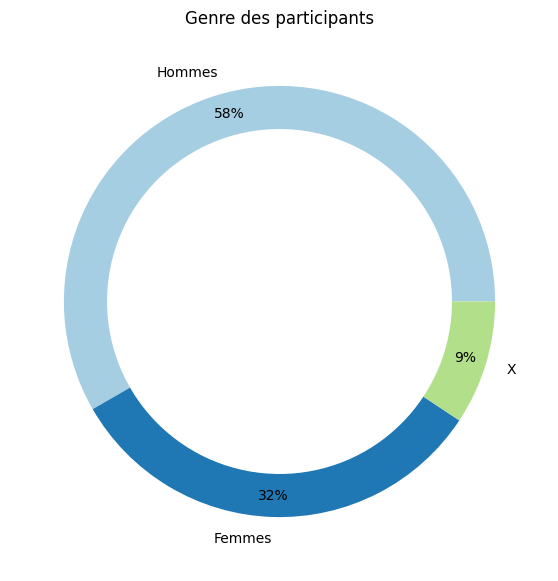

In [44]:
# Постороим круговую диаграмму распределения участников по полу
genre_res['%'].plot(
    kind = 'pie',
    figsize = (7,7),
    labels = ['Hommes', 'Femmes', 'X'],
    autopct = '%1.0f%%',
    pctdistance = 0.9,
    ylabel = '',
    # counterclock=False,
    # startangle=45,
    # colormap = 'Paired'
    colors=GENRE_COLORS.values()
);
plt.title('Genre des participants');

# draw circle
centre_circle = plt.Circle((0, 0), 0.80, fc='white')
fig = plt.gcf();
# Adding Circle in Pie chart
fig.gca().add_artist(centre_circle);

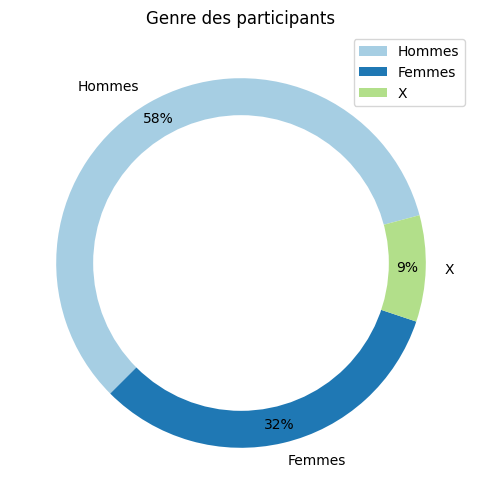

In [45]:
# Постороим вторую версию диаграммы для части предсказания
# fig = plt.figure(figsize=(4,4))
genre_res['%'].plot(
    kind = 'pie',
    figsize = (6,6),
    labels = ['Hommes', 'Femmes', 'X'],
    autopct = '%1.0f%%',
    pctdistance = 0.9,
    ylabel = '',
    # counterclock=False,
    startangle=15,
    colors=GENRE_COLORS.values()
);
plt.title('Genre des participants');
plt.legend()

# draw circle
centre_circle = plt.Circle((0, 0), 0.8, fc='white')
fig = plt.gcf();
# Adding Circle in Pie chart
fig.gca().add_artist(centre_circle);

## 2.2. Bénévoles

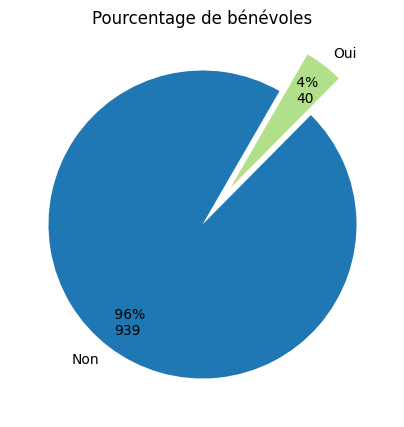

In [46]:
# Постороим круговую диаграмму распределения пола участников
benls_res['%'].plot(
    kind = 'pie',
    figsize = (5,5),
    autopct=lambda pct: f' {pct:.0f}%\n{pct/100*benls_res.iloc[:,0].sum():.0f}',
    explode=[0, 0.3],
    pctdistance = 0.8,
    startangle = 60,
    # counterclock=False,
    ylabel = '',
    colors=list(GENRE_COLORS.values())[1:]
);
plt.title("Pourcentage de bénévoles");

In [47]:
benls_ttl = df.pivot_table(
    index='Genre',
    columns='Bénévole',
    values='ID',
    margins=True,
    margins_name='Total',
    aggfunc='count',
    sort=False
).rename({True: 'Bénévole', False: 'Non'}, axis=1).sort_values(by='Total', ascending=False)

# Вычислим доли добровольцев по каждому полу (добавляем столбцы)
for i in range(len(benls_ttl.columns)-1):
    benls_ttl[benls_ttl.columns[i]+', %'] = benls_ttl.iloc[:, i] / benls_ttl['Total'] * 100

# Вычислим доли каждого пола среди добровольцев и не- (добавляем строки), остальные столбцы игнорируем
for i in range(1, len(benls_ttl.index)):
    benls_ttl.loc[benls_ttl.index[i]+', %'] = benls_ttl.iloc[i, 0:2] / benls_ttl.iloc[0, 0:2]*100

# Вычислим доли добровольцев среди кажого пола от общего числа участников
for row in range(1, 4):
    for col in range(2):
        benls_ttl.iloc[row+3, col+3] = benls_ttl.iloc[row, col] / benls_ttl.loc['Total', 'Total']*100

benls_ttl = benls_ttl.round(2)
benls_ttl.columns.name = ''

# Посмотрим на результат
benls_ttl

,Bénévole,Non,Total,"Bénévole, %","Non, %"
Genre,,,,,
Total,40.0,939.00,979.0,4.09,95.91
H,21.0,550.00,571.0,3.68,96.32
F,11.0,306.00,317.0,3.47,96.53
X,8.0,83.00,91.0,8.79,91.21
"H, %",52.5,58.57,NaN,2.15,56.18
"F, %",27.5,32.59,NaN,1.12,31.26
"X, %",20.0,8.84,NaN,0.82,8.48


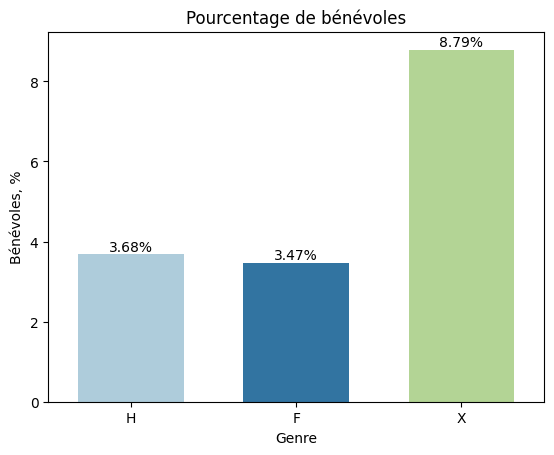

In [48]:
data = benls_ttl.loc['H':'X']

barplot = sns.barplot(
    data=data,
    x=data.index,
    y='Bénévole, %',
    hue=data.index,
    hue_order=['H', 'F', 'X'],
    palette='Paired',
    width=0.8,
    gap=0.2
);
barplot.set_title('Pourcentage de bénévoles');
barplot.set_xlabel('Genre');
barplot.set_ylabel('Bénévoles, %');

for container in barplot.containers:
    barplot.bar_label(container, fmt='%.2f%%');

## 2.3. Code postal

In [49]:
# Первая версия без районов
print('Pourcentage de participants par commune :')
round(df[df['Commune_CP'] != '']['Commune_nom'].value_counts(normalize=True).sort_values(ascending=False)*100, 2).to_frame(name='%')

Pourcentage de participants par commune :


,%
NANTES,77.83
REZE,8.27
Hors Nantes,4.70
ST SEBASTIEN SUR LOIRE,2.96
N/A,1.33
BOUGUENAIS,1.23
ST HERBLAIN,1.02
VERTOU,0.72
THOUARE SUR LOIRE,0.51
ORVAULT,0.31


In [50]:
cp_pie = round(df['Nantes_quartier'].value_counts(normalize=True).sort_values(ascending=False)*100, 2)
print('Pourcentage de participants par quartier :')
cp_pie.to_frame('%')

Pourcentage de participants par quartier :


,%
NANTES : 44000,41.27
NANTES : 44200,17.67
NANTES : 44100,11.13
REZE,8.27
NANTES : 44300,7.76
Hors Nantes,4.70
ST SEBASTIEN SUR LOIRE,2.96
N/A,1.33
BOUGUENAIS,1.23
ST HERBLAIN,1.02


In [51]:
# Объединим все комунны меньше 1% в запись "Autres"
autre_cp = pd.Series(data = [cp_pie[(cp_pie < 1) == True].sum()],
                     index = ['Autres communes'])

comp_cp_pie = pd.concat([cp_pie[(cp_pie >= 1) == True],
                        autre_cp])

display(comp_cp_pie)

NANTES : 44000            41.27
NANTES : 44200            17.67
NANTES : 44100            11.13
REZE                       8.27
NANTES : 44300             7.76
Hors Nantes                4.70
ST SEBASTIEN SUR LOIRE     2.96
N/A                        1.33
BOUGUENAIS                 1.23
ST HERBLAIN                1.02
Autres communes            2.65
dtype: float64

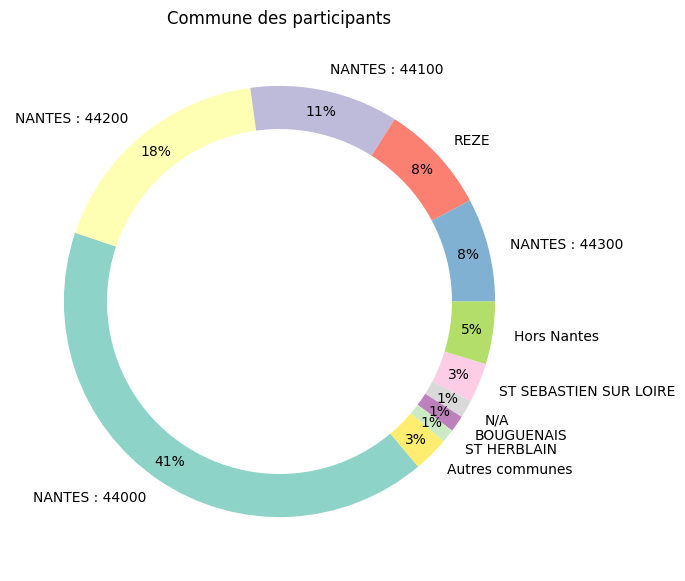

In [52]:
# Постороим круговую диаграмму распределения участников по комуннам
comp_cp_pie.plot(
    kind = 'pie',
    figsize = (7,7),
    autopct = '%1.0f%%',
    pctdistance = 0.9,
    ylabel = '',
    counterclock=False,
    startangle=-50,
    colormap = 'Set3'
);
plt.title('Commune des participants');

# draw circle
centre_circle = plt.Circle((0, 0), 0.80, fc='white')
fig = plt.gcf();
# Adding Circle in Pie chart
fig.gca().add_artist(centre_circle);

## 2.4. Age  

In [53]:
top_age = df['Age'].value_counts().nlargest(10).sort_index(ascending=True).to_frame('Participants')
top_age.index = top_age.index.astype(int)
top_age.index.name = 'Age'
print('Les 10 principaux âges\ndes participants :')
top_age

Les 10 principaux âges
des participants :


,Participants
Age,
25,40
26,45
27,59
28,73
29,63
30,54
31,63
32,52
33,53


In [54]:
print('Age moyen des participants:', df['Age'].mean().astype(int))
print('Age médian des participants:', df['Age'].median().astype(int))

Age moyen des participants: 33
Age médian des participants: 31


In [146]:
df_avg_age = df.groupby('Genre')['Age'].agg(['mean', 'median']).round(2)
df_avg_age['median'] = df_avg_age['median'].astype(int)
df_avg_age = df_avg_age.reindex(index=GENRE_COLORS.keys())
display('Age moyen et médian par genre:', df_avg_age)

'Age moyen et médian par genre:'

,mean,median
Genre,,
H,33.50,31
F,32.56,30
X,33.95,32


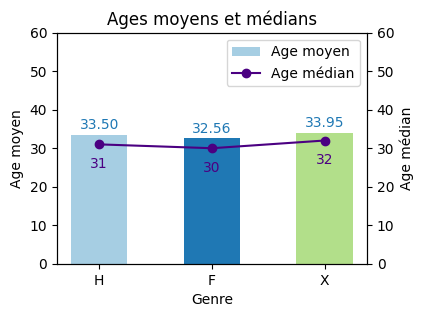

In [183]:
fig, ax1 = plt.subplots(figsize=(4,3))
ax2 = ax1.twinx()

color = 'indigo'

p1 = ax1.bar(x=df_avg_age.index.to_list(),
             height=df_avg_age['mean'],
             label='Age moyen',
             color=GENRE_COLORS.values(),
             width=0.5
)
ax1.set(ylim=(0, 60), xlabel='Genre', ylabel="Age moyen")
ax1.bar_label(p1, fmt='%.2f', label_type='edge', padding=2, color=GENRE_COLORS['F'])

p2, = ax2.plot(df_avg_age['median'],
        label="Age médian",
        marker='o',
        color=color
)
ax2.set(ylim=(0, 60), ylabel="Age médian")
for x, y in zip(df_avg_age.index.to_list(), df_avg_age['median'].astype(int)): 
    plt.text(x, y, str(y), ha='center', va='center', position=(x, y-5), color=color)

ax1.legend(handles=[p1, p2])
ax1.set_title("Ages moyens et médians");

plt.show()

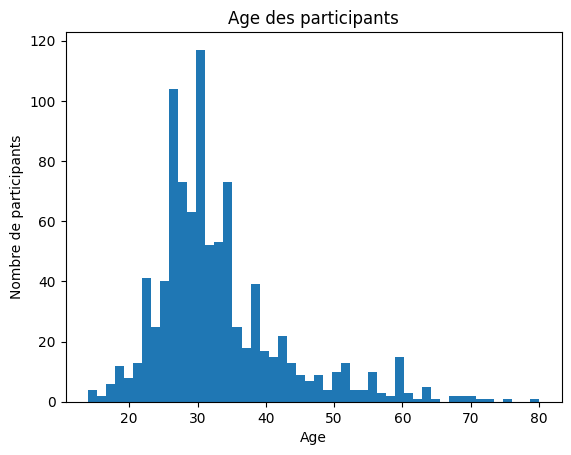

In [57]:
# fig = plt.figure(figsize=(14,6))
ax = df['Age'].hist(bins=50,
                    density=False,
                    histtype='bar',
                    grid=False,
                    stacked=True);
ax.set(title='Age des participants', xlabel='Age', ylabel='Nombre de participants');

In [58]:
genre_age = pd.pivot_table(data=df,
                           index='Age',
                           columns='Genre',
                           values='ID',
                           aggfunc='count',
                           fill_value=0,
                           margins=True
                           )
genre_age.columns.name = ''
genre_age.drop('All', axis=0, inplace=True)
genre_age.index = genre_age.index.astype(int)

print('Les 10 principaux âges\ndes participants par genre:')
genre_age.loc[25:34, :]

Les 10 principaux âges
des participants par genre:


,F,H,X,All
Age,,,,
25,16,20,4,40
26,11,29,5,45
27,22,32,5,59
28,28,41,4,73
29,27,28,8,63
30,21,30,3,54
31,23,34,6,63
32,20,29,3,52
33,17,28,8,53


In [59]:
print('Возраст, где число женщин больше числа мужчин:')
genre_age[genre_age['F'] > genre_age['H']]

Возраст, где число женщин больше числа мужчин:


,F,H,X,All
Age,,,,
24,12,10,3,25
41,6,5,4,15
47,2,1,0,3
49,2,1,1,4
54,2,1,1,4
64,1,0,0,1
65,1,0,0,1
80,1,0,0,1


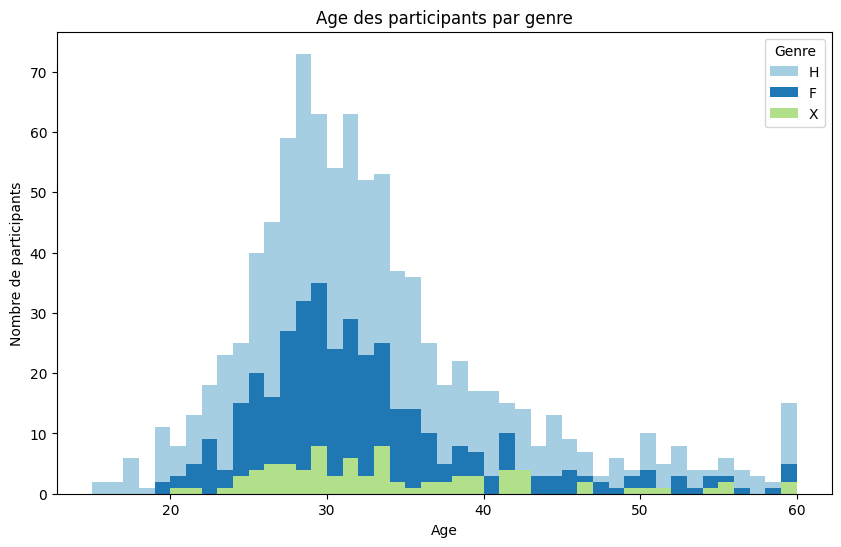

In [182]:
# Расположим на гистограмме для наглядности снизу вверх группы по их численности: Х - F - H
# Для этого зададим иной порядок полов и подготовим списки
hist_genres = ['X', 'F', 'H']

data = [df[df['Genre'] == genre]['Age'] for genre in hist_genres]
colors = [GENRE_COLORS[genre] for genre in hist_genres]

fig = plt.figure(figsize=(10,6))

p = plt.hist(data,
         bins=45,
         density=False,
         histtype='bar',
         stacked=True,
         label=hist_genres,
         range=(15, 60), # для презентации не будет отображать выбросы
         color=colors);

plt.title('Age des participants par genre')
plt.xlabel('Age')
plt.ylabel('Nombre de participants')

# Зададим нужный порядок в легенде
handles, labels = plt.gca().get_legend_handles_labels()
order = [2,1,0]
plt.legend([handles[idx] for idx in order],
           [labels[idx] for idx in order],
           title='Genre');

del hist_genres, data, colors

## 2.5. Montant  

In [184]:
# Посмотрим на средний и медианный размер взноса по году
df['Montant'].describe()

count    979.000000
mean      18.326864
std       13.378989
min        0.000000
25%       10.000000
50%       15.000000
75%       20.000000
max       80.000000
Name: Montant, dtype: float64

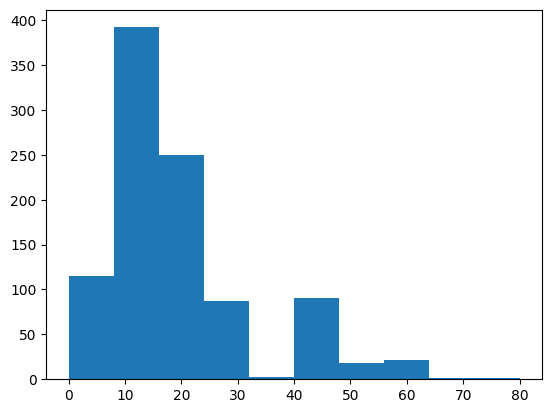

In [61]:
df['Montant'].hist(bins = 10, grid=False);

In [62]:
montant_pie = round(df['Montant'].value_counts(normalize=True).sort_index(ascending=True)*100, 2)

# Объединим все комунны меньше 1% в запись "Autres"
autre_montant = pd.Series(data = [montant_pie[(montant_pie < 1) == True].sum()],
                          index = ['Autres'])

comp_montant_pie = pd.concat([montant_pie[(montant_pie >= 1) == True],
                              autre_montant])

# Добавим значок евро в индекс
comp_montant_pie.index = comp_montant_pie.index.to_series().\
    apply(lambda x: str(x)+' €' if type(x) == int else x).to_list()
print('Pourcentage des montants\ndes participations :')
display(comp_montant_pie.to_frame(name='%'))

Pourcentage des montants
des participations :


,%
0 €,8.27
5 €,2.04
10 €,32.99
15 €,5.82
20 €,25.03
25 €,1.12
30 €,7.46
40 €,8.89
50 €,1.84
60 €,2.15


In [63]:
# Доля RENOUVELLEMENT, VOYAGEUR.EUSE, SOLIDAIRE составляет 1,73%
df['Zero_montant'].value_counts(normalize=True).iloc[1:].sum()*100

1.7364657814096014

In [64]:
# Сформируем список индексов-сумм взносов, которые не делятся на 5 без остатка
ind = []
[ind.append(i) for i in montant_pie.index if i%5 != 0]

print('Contributions\nnon divisibles par 5\nsans reste :')
montant_pie[ind].to_frame('%')

Contributions
non divisibles par 5
sans reste :


,%
1,0.31
2,0.51
3,0.31
4,0.20
6,0.10
8,0.61
9,0.10
12,0.20
13,0.20
14,0.10


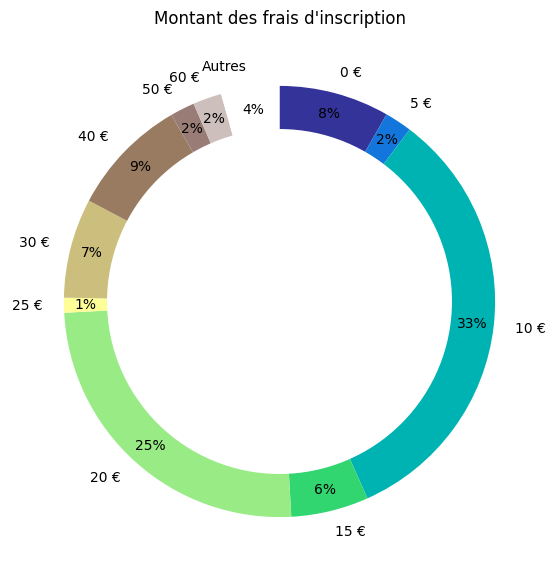

In [65]:
comp_montant_pie.plot(
    kind = 'pie',
    figsize = (7,7),
    autopct = '%1.0f%%',
    pctdistance = 0.9,
    ylabel = '',
    startangle=90,
    counterclock=False,
    colormap = 'terrain'
);
plt.title("Montant des frais d'inscription");

# draw circle
centre_circle = plt.Circle((0, 0), 0.80, fc='white')
fig = plt.gcf();
# Adding Circle in Pie chart
fig.gca().add_artist(centre_circle);

## 2.6 Comparison of the 2023-2024 and the 2024-2025 seasons  
Let's compare the available data on members who renewed their membership from August through November 2024 to the same period in 2023 to see the trend.  

In [3]:
# Read relevant database and prepare it for manipulations
df_2024 = pd.read_excel('data/Données-24-25.xlsx')
df_2024.drop('Commentaire', axis=1, inplace=True)
df_2024.columns = ['ID', 'Naissance', 'Genre', 'Quartier', 'Bénévole', 'Montant', 'Inscription']

In [6]:
# Perform the same transformations as for the main dataframe
df_2024['Zero_montant'] = df_2024['Montant'].apply(lambda s: s.upper() if type(s) == str else '')
df_2024['Montant'] = df_2024['Montant'].apply(lambda s: montant_todigit(s) if type(s) == str\
                                              else (0 if s is np.nan\
                                                    else int(s)))
# Check the number of subscriptions without payment
print("Le nombre d'entrées avec raison spécifique pour un zero montant :", df_2024[df_2024['Zero_montant'] != '']['Zero_montant'].count())

Le nombre d'entrées avec raison spécifique pour un zero montant : 14


In [7]:
# Check if there are any missing dates
print('Number of empty dates of inscription:', df_2024['Inscription'].isnull().sum())
# Extracting month and year of subscription
df_2024['MOI'] = df_2024['Inscription'].dt.month
df_2024['YOI'] = df_2024['Inscription'].dt.year

Number of empty dates of inscription: 0


In [8]:
# Finding out that November is the last available month in the season of 2024-2025
last_month_24 = df_2024['MOI'].max()
print("Le dernier mois d'inscription pour la saison de 2024-2025:", last_month_24)

Le dernier mois d'inscription pour la saison de 2024-2025: 11


In [ ]:
# Посчитаем количество участников, зарегистрированных с августа по ноябрь в каждом году
ind_23 = df[(df['MOI'] >= 8) & (df['MOI'] <= last_month_24)].index
parts_23 = df.loc[ind_23, :].shape[0]
parts_24 = df_2024.shape[0]
print(f"Nombre de participants inscrits jusqu'au Nov'23 : {parts_23}.")
print(f"Nombre de participants inscrits jusqu'au Nov'24 : {parts_24}, soit {round(parts_23 / parts_24, 2)} fois moins.")

Nombre de participants inscrits jusqu'au Nov'23 : 461.
Nombre de participants inscrits jusqu'au Nov'24 : 326, soit 1.41 fois moins.


In [ ]:
mont_23 = df.loc[ind_23, 'Montant'].sum()
mont_24 = df_2024['Montant'].sum()
print(f"Montant total d'inscription jusqu'au Nov'23 : {mont_23}.")
print(f"Montant total d'inscription jusqu'au Nov'24 : {mont_24}, soit {round(mont_23 / mont_24, 2)} fois moins.")

Montant total d'inscription jusqu'au Nov'23 : 9229.
Montant total d'inscription jusqu'au Nov'24 : 6576, soit 1.4 fois moins.


In [ ]:
print(f"Montant moyen d'inscription jusqu'au Nov'23 : {df.loc[ind_23, 'Montant'].mean().round(2)}.")
print(f"Montant moyen d'inscription jusqu'au Nov'24 : {df_2024['Montant'].mean().round(2)}.")


Montant moyen d'inscription jusqu'au Nov'23 : 20.02.
Montant moyen d'inscription jusqu'au Nov'24 : 20.17.


In [ ]:
# A list of features to join on
feat_list = ['Montant', 'MOI', 'YOI']

# Create joined df
df_23_24 = pd.concat([df.loc[ind_23, feat_list],
                      df_2024[feat_list]])
# print(f'Total number of subscriptions till Nov in 2023 and 2024:', df_23_24.shape[0])

df_23_24['MOI'] = df_23_24['MOI'].apply(lambda x: MONTHS_LIST[x])

Total number of subscriptions till Nov in 2023 and 2024: 787


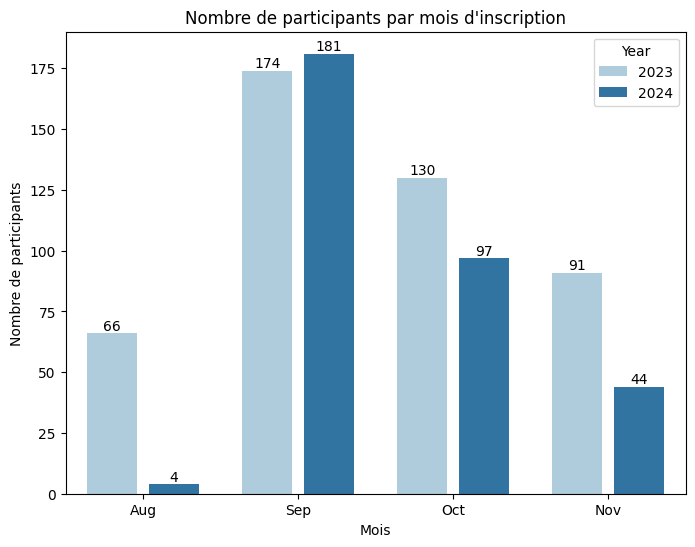

In [ ]:
fig = plt.figure(figsize=(8,6))
barplot = sns.barplot(
    df_23_24,
    x="MOI",
    y='Montant',
    hue="YOI",
    errorbar=None,
    dodge='auto',
    palette='Paired',
    width=0.8,
    gap=0.2,
    estimator='count'
);
barplot.set_title("Nombre de participants par mois d'inscription");
barplot.legend(title="Year");
barplot.set_xlabel('Mois');
barplot.set_ylabel("Nombre de participants");
for container in barplot.containers:
    barplot.bar_label(container, label_type='edge');

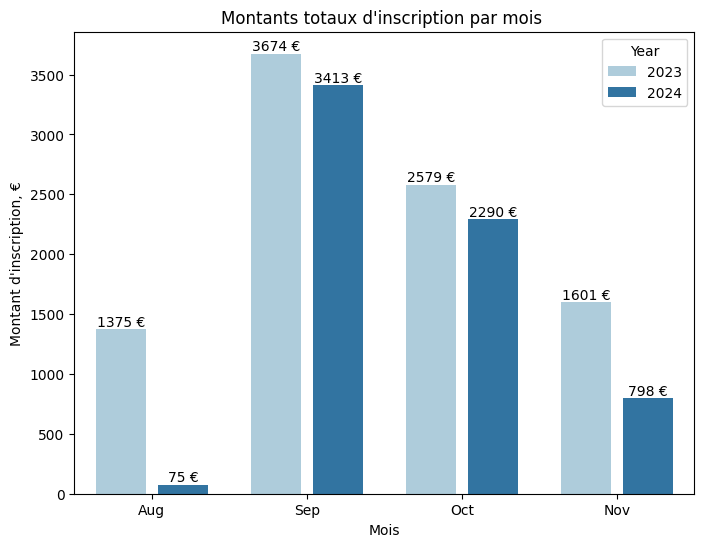

In [ ]:
fig = plt.figure(figsize=(8,6))
barplot = sns.barplot(
    df_23_24,
    x="MOI",
    y='Montant',
    hue="YOI",
    errorbar=None,
    dodge='auto',
    palette='Paired',
    width=0.8,
    gap=0.2,
    estimator='sum'
);
barplot.set_title("Montants totaux d'inscription par mois ");
barplot.legend(title="Year");
barplot.set_xlabel('Mois');
barplot.set_ylabel("Montant d'inscription, €");
for container in barplot.containers:
    barplot.bar_label(container, fmt= '%.0f €', label_type='edge');

# 3. In-depth data analysis  
**The purpose of this analysis is to answer the questions**:  
1. From which commune do the most people, women/men, come from?  
2. Median, max, and min age for each commune?  
3. Which commune brought in the most/least amount of money, broken down by gender?  
4. Which communes do volunteers come from, gender distribution?  
5. Relationship of volunteer, amount of fee, gender and age?  
6. Relationship of gender, age, commune of participants.  

## 1. From which commune do the most people, women/men, come from?   

In [66]:
# Из какой комунны больше всего человек
ttl_gens = df.pivot_table(
    index=['Nantes_quartier'],
    columns='Genre',
    values='ID',
    aggfunc='count',
    margins=True,
    margins_name='Total',
    fill_value = 0
)#.drop(('Total', ''), axis=0) # сразу удалю итоговую строку
ttl_gens = ttl_gens.sort_values(['Total'], ascending=False)
print('Из какой комунны больше всего человек?')
display('Nombre de participants par commune et par genre', ttl_gens)

Из какой комунны больше всего человек?


'Nombre de participants par commune et par genre'

Genre,F,H,X,Total
Nantes_quartier,,,,
Total,317,571,91,979
NANTES : 44000,137,234,33,404
NANTES : 44200,56,106,11,173
NANTES : 44100,31,70,8,109
REZE,21,46,14,81
NANTES : 44300,28,39,9,76
Hors Nantes,14,24,8,46
ST SEBASTIEN SUR LOIRE,9,19,1,29
N/A,4,7,2,13


In [67]:
# Для построения графиков горизонатльная сумма не понаобится, поэтому удалим ряд
ttl_gens.drop('Total', axis=0, inplace=True)

# Зададим маски для фильтрации
mask_big = ttl_gens['Total'] >= 10
mask_small = ttl_gens['Total'] < 10

In [68]:
# Соберем в одну строку комунны, где меньше 10 участников
ttl_gens_autres = ttl_gens[mask_small].sum().to_frame().T.rename(index={0: 'Autres communes'})
# Составим сжатую таблицу
ttl_gens_comp = pd.concat([ttl_gens[mask_big],
                           ttl_gens_autres])
# Посмотрим на результат
ttl_gens_comp.columns.name = ''
ttl_gens_comp.index.name = 'Nantes_quartier'
ttl_gens_comp

,F,H,X,Total
Nantes_quartier,,,,
NANTES : 44000,137,234,33,404
NANTES : 44200,56,106,11,173
NANTES : 44100,31,70,8,109
REZE,21,46,14,81
NANTES : 44300,28,39,9,76
Hors Nantes,14,24,8,46
ST SEBASTIEN SUR LOIRE,9,19,1,29
N/A,4,7,2,13
BOUGUENAIS,3,7,2,12


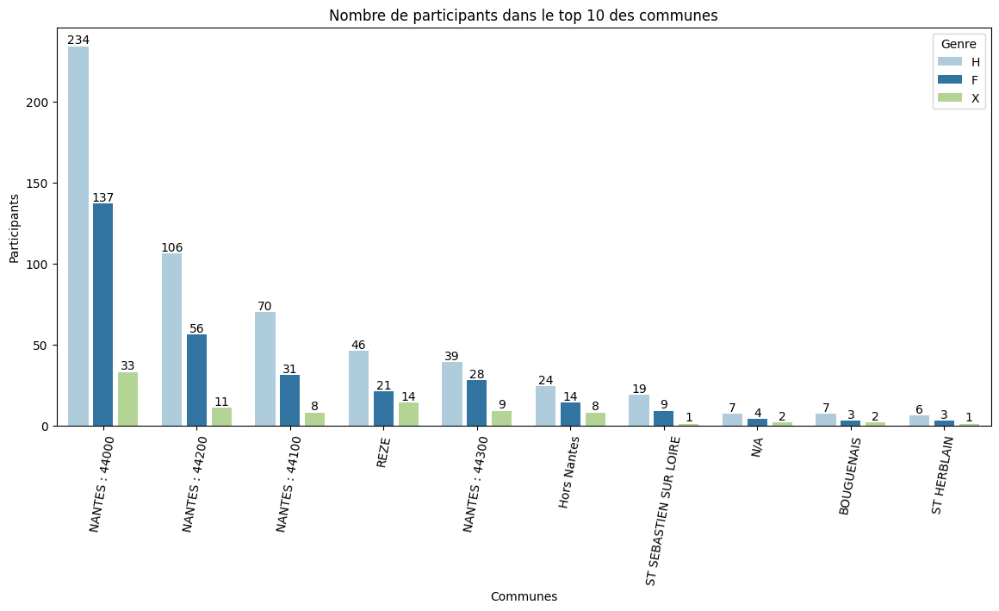

In [69]:
fig = plt.figure(figsize=(14,6))
countplot = sns.countplot(
    data=df,
    x='Nantes_quartier',
    order=ttl_gens_comp.index[:-1], # отображаю только ТОП-10 без "других", т.к. они не отрисовываются
    hue='Genre',
    hue_order=['H', 'F', 'X'],
    palette='Paired',
    dodge=True, # разделение баров по легенде
    width=0.8,
    gap=0.2
)
countplot.set_title('Nombre de participants dans le top 10 des communes');
countplot.set_xlabel('Communes');
countplot.set_ylabel('Participants');
countplot.tick_params(axis='x', labelrotation=80, labelsize=10);
for container in countplot.containers:
    countplot.bar_label(container);

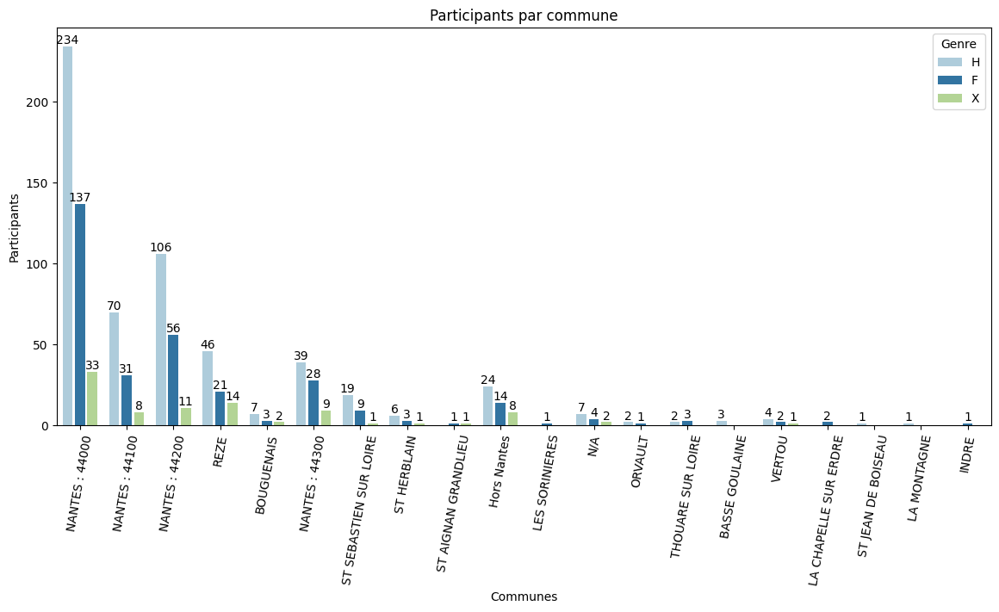

In [70]:
fig = plt.figure(figsize=(14,6))
countplot = sns.countplot(
    data=df,
    x='Nantes_quartier',
    # order=ttl_gens.drop('Total', axis=0).index,
    hue='Genre',
    hue_order=['H', 'F', 'X'],
    palette='Paired',
    dodge=True, # разделение баров по легенде
    width=0.8,
    gap=0.2
)
# sns.despine(fig);
countplot.set_title('Participants par commune');
countplot.set_xlabel('Communes');
countplot.set_ylabel('Participants');
countplot.tick_params(axis='x', labelrotation=80, labelsize=10);
for container in countplot.containers:
    countplot.bar_label(container);

## 2. Median, max, and min age for each commune?  

In [71]:
# Возраст по комуннам
commune_age = df.pivot_table(
    index=['Nantes_quartier'],
    values='Age',
    aggfunc=['min', 'median', 'max'],
    fill_value = 0
).droplevel(1, axis=1)
commune_age = commune_age.sort_values(by='median', ascending=False)
print('Возраст по комуннам')
display("Age par commune", commune_age)

Возраст по комуннам


'Age par commune'

,min,median,max
Nantes_quartier,,,
LA MONTAGNE,59,59.0,59
ST AIGNAN GRANDLIEU,46,54.5,63
BASSE GOULAINE,28,48.5,69
ORVAULT,34,46.5,59
BOUGUENAIS,23,38.5,60
N/A,22,38.0,60
VERTOU,14,36.5,71
ST HERBLAIN,28,35.0,54
ST SEBASTIEN SUR LOIRE,24,35.0,70


## 3. Which commune brought in the most/least amount of money, broken down by gender?  

In [72]:
# Какая комунна принесла больше/меньше всего денег
commune_montant = df.pivot_table(
    index=['Nantes_quartier'],
    columns='Genre',
    values='Montant',
    aggfunc=['min', 'median', 'mean', 'max', 'sum'],
    fill_value=0
    # margins=True,
    # margins_name='Total'
).sort_values(by=('sum', 'H'), ascending=False).round(2)
#commune_montant = commune_montant.sort_values(by='sum', ascending=False)
print('Размеры взносов по комуннам?')
display("Montants d'inscription par commune", commune_montant)

Размеры взносов по комуннам?


"Montants d'inscription par commune"

min         median             mean               max  \
Genre                    F   H   X      F     H   X      F      H      X   F   
Nantes_quartier                                                                
NANTES : 44000           0   0   0   10.0  15.0  10  16.66  18.08  15.15  60   
NANTES : 44200           0   0   3   10.0  20.0  15  18.02  19.94  24.00  80   
NANTES : 44100           8   0   0   20.0  20.0  15  18.81  19.71  20.00  60   
REZE                    10   0   5   15.0  20.0  15  18.10  22.26  16.64  50   
NANTES : 44300           0   0   1   17.5  20.0  15  19.64  19.67  18.78  70   
ST SEBASTIEN SUR LOIRE   8   0  10   20.0  20.0  10  23.11  20.00  10.00  60   
Hors Nantes              0   0   0    7.0  10.0  10  10.29  13.21   8.75  60   
BOUGUENAIS              20  10  16   40.0  20.0  28  33.33  22.86  28.00  40   
ST HERBLAIN             10  10  10   30.0  17.5  10  33.33  22.50  10.00  60   
N/A                      0   0   0   15.0  10.0  10  12.50  11.71  10.00  20   
BASSE GOULAINE           0  10   0    0.0  30.0   0   0.00  23.33   0.00   0   
VERTOU                  15   0  10   17.5  15.0  10  17.50  17.50  10.00  20   
THOUARE SUR LOIRE        0  10   0   10.0  25.0   0   8.67  25.00   0.00  16   
ST JEAN DE BOISEAU       0  30   0    0.0  30.0   0   0.00  30.00   0.00   0   
ORVAULT                 40  10   0   40.0  10.0   0  40.00  10.00   0.00  40   
LES SORINIERES          10   0   0   10.0   0.0   0  10.00   0.00   0.00  10   
LA MONTAGNE              0   0   0    0.0   0.0   0   0.00   0.00   0.00   0   
ST AIGNAN GRANDLIEU     10   0  30   10.0   0.0  30  10.00   0.00  30.00  10   
LA CHAPELLE SUR ERDRE   10   0   0   25.0   0.0   0  25.00   0.00   0.00  40   
INDRE                    3   0   0    3.0   0.0   0   3.00   0.00   0.00   3   

                                 sum             
Genre                    H   X     F     H    X  
Nantes_quartier                                  
NANTES : 44000          60  40  2282  4231  500  
NANTES : 44200          60  60  1009  2114  264  
NANTES : 44100          60  50   583  1380  160  
REZE                    50  30   380  1024  233  
NANTES : 44300          60  40   550   767  169  
ST SEBASTIEN SUR LOIRE  50  10   208   380   10  
Hors Nantes             40  20   144   317   70  
BOUGUENAIS              40  40   100   160   56  
ST HERBLAIN             60  10   100   135   10  
N/A                     20  20    50    82   20  
BASSE GOULAINE          30   0     0    70    0  
VERTOU                  40  10    35    70   10  
THOUARE SUR LOIRE       40   0    26    50    0  
ST JEAN DE BOISEAU      30   0     0    30    0  
ORVAULT                 10   0    40    20    0  
LES SORINIERES           0   0    10     0    0  
LA MONTAGNE              0   0     0     0    0  
ST AIGNAN GRANDLIEU      0  30    10     0   30  
LA CHAPELLE SUR ERDRE    0   0    50     0    0  
INDRE                    0   0     3     0    0

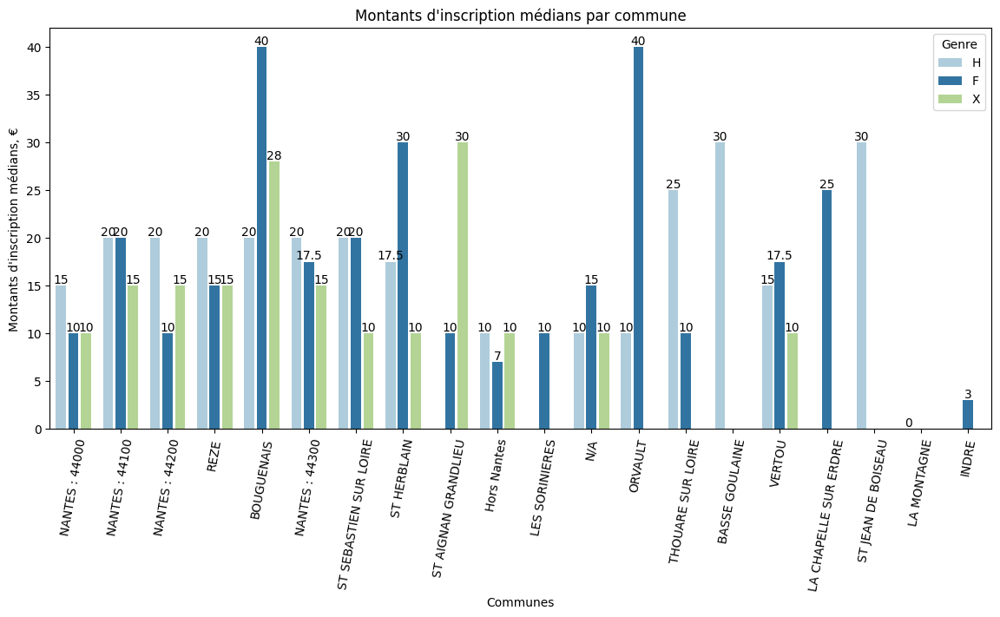

In [73]:
fig = plt.figure(figsize=(14,6))
barplot = sns.barplot(
    df,
    x="Nantes_quartier",
    y='Montant',
    hue="Genre",
    # order=commune_montant.index,
    errorbar=None,
    dodge='auto',
    palette='Paired',
    width=0.8,
    gap=0.2,
    estimator='median'
);
barplot.tick_params(axis='x', labelrotation=80, labelsize=10);
barplot.set_title("Montants d'inscription médians par commune");
barplot.set_xlabel('Communes');
barplot.set_ylabel("Montants d'inscription médians, €");
for container in barplot.containers:
    barplot.bar_label(container, label_type='edge');

In [74]:
# Суммы взносов по комуннам с разбивкой по полу
ttl_montant = df.pivot_table(
    # index=['Commune_nom', 'Nantes_quartier'],
    index=['Nantes_quartier'],
    columns='Genre',
    values='Montant',
    aggfunc='sum',
    margins=True,
    margins_name='Total',
    fill_value = 0
)
ttl_montant = ttl_montant.sort_values(['Total'], ascending=False)

# Добавим доли комунн
ttl = ttl_montant['Total'].sum()/2
ttl_montant['Share, %'] = round(ttl_montant['Total'] / ttl * 100, 2)

print('Суммы взносов по комуннам с разбивкой по полу')
display("Frais d'inscription par genre", ttl_montant)
del ttl

Суммы взносов по комуннам с разбивкой по полу


"Frais d'inscription par genre"

Genre,F,H,X,Total,"Share, %"
Nantes_quartier,,,,,
Total,5580,10830,1532,17942,100.00
NANTES : 44000,2282,4231,500,7013,39.09
NANTES : 44200,1009,2114,264,3387,18.88
NANTES : 44100,583,1380,160,2123,11.83
REZE,380,1024,233,1637,9.12
NANTES : 44300,550,767,169,1486,8.28
ST SEBASTIEN SUR LOIRE,208,380,10,598,3.33
Hors Nantes,144,317,70,531,2.96
BOUGUENAIS,100,160,56,316,1.76


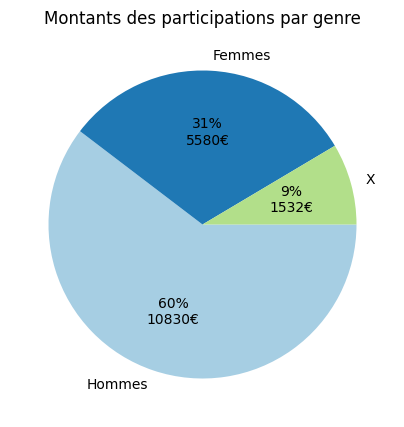

In [75]:
# Постороим круговую диаграмму распределения пола участников
ttl_montant.iloc[0, :3].sort_values(ascending=False).plot(
    kind = 'pie',
    figsize = (5,5),
    labels = ['Hommes', 'Femmes', 'X'],
    autopct=lambda pct: f'{pct:.0f}%\n{pct/100*ttl_montant.iloc[0, :3].sum():.0f}€',
    pctdistance = 0.6,
    startangle = 0,
    counterclock=False,
    ylabel = '',
    colors=GENRE_COLORS.values()
);
plt.title('Montants des participations par genre');

In [76]:
ttl_montant_top = ttl_montant[ttl_montant['Share, %'] > 1]
# display(ttl_montant_top)

# ВНИМАНИЕ! Для простоты всю строку привожу к типу int - теряется точность Share
ttl_montant_bottom = ttl_montant[ttl_montant['Share, %'] <= 1].sum().astype(int).to_frame().T
ttl_montant_bottom.index = ['Autres communes']
ttl_montant_bottom['Share, %'] = 3.38 # Восстанавливаю точность
ttl_montant_bottom
# display(ttl_montant_bottom)

comp_ttl_montant = pd.concat([ttl_montant_top, ttl_montant_bottom])
print("Montant total des frais d'inscription par commune et par genre :")
display(comp_ttl_montant)

Montant total des frais d'inscription par commune et par genre :


Genre,F,H,X,Total,"Share, %"
Total,5580,10830,1532,17942,100.00
NANTES : 44000,2282,4231,500,7013,39.09
NANTES : 44200,1009,2114,264,3387,18.88
NANTES : 44100,583,1380,160,2123,11.83
REZE,380,1024,233,1637,9.12
NANTES : 44300,550,767,169,1486,8.28
ST SEBASTIEN SUR LOIRE,208,380,10,598,3.33
Hors Nantes,144,317,70,531,2.96
BOUGUENAIS,100,160,56,316,1.76
ST HERBLAIN,100,135,10,245,1.37


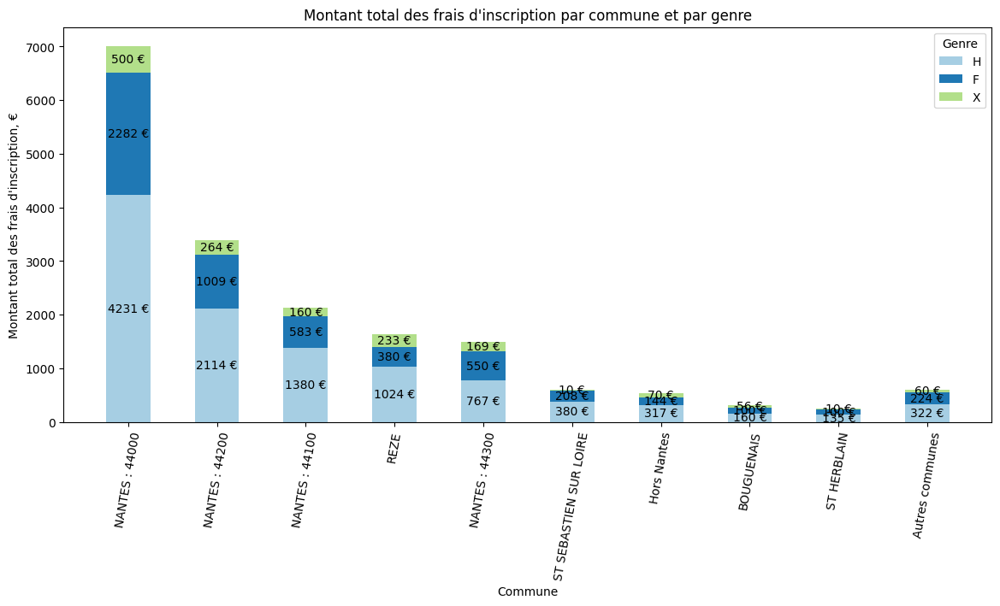

In [77]:
fig, ax = plt.subplots(figsize=(14,6))
bottom = np.zeros(len(comp_ttl_montant.drop('Total', axis=0).index), dtype='int64')

# Зададим нужный порядок вывода столбцов для наглядности
for column in ['H', 'F', 'X']:
    montant = comp_ttl_montant[column].drop('Total', axis=0).to_list()
    p = ax.bar(x=comp_ttl_montant.drop('Total', axis=0).index.to_list(),
               height=montant,
               label=column,
               bottom=bottom,
               color=GENRE_COLORS[column],
               log=False,
               width=0.5);
    bottom += montant
    ax.bar_label(p, label_type='center', fmt='%.0f €')
    
ax.legend(title='Genre', loc="upper right");
ax.set(title="Montant total des frais d'inscription par commune et par genre",
       xlabel="Commune",
       ylabel="Montant total des frais d'inscription, €");
ax.tick_params(axis='x', labelrotation=80, labelsize=10);

In [78]:
# Для построения treemap добавим два признака
df['Metropole'] = df['Commune_nom'].apply(lambda x: 'Autres metropoles' if x in ['Hors Nantes', 'N/A'] else 'Nantes Metropole')
df['Commune'] = df['Commune_nom'].apply(lambda x: 'Nantes commune' if x == 'NANTES' else 'Autres communes')

In [79]:
c_map = GENRE_COLORS.copy()
c_map.update({'(?)': 'lightgrey'})

# Посмотрим, сколько денег принесла каждая комунна с разбивкой по полу
fig = px.treemap(
    df,
    path=[px.Constant("France"), "Metropole", "Commune", "Nantes_quartier", 'Genre'],
    values="Montant",
    color="Genre",
    # color_discrete_map={'(?)': 'lightgrey', 'H': 'violet', 'F': "lightgreen", 'X': 'gray'},
    color_discrete_map=c_map,    
    title="Montant des frais d'inscription par commune et par genre"
)
fig.update_traces(root_color="lightgrey");
fig.update_layout(margin=dict(t=50, l=25, r=25, b=25));
fig.show();

if SAVE_TO_FILES:
    fig.write_image('pics/Plotly_treemap_Montant.png');
    fig.write_html('pics/Plotly_treemap_Montant.html');

In [80]:
# Удалим два признака, т.к. они больше не понадобятся
df.drop(['Metropole', 'Commune'], axis=1, inplace=True)

## 4. Which communes do volunteers come from, gender distribution?  

In [81]:
# Добровольцы по комуннам
commune_bene = df.pivot_table(
    index='Nantes_quartier',
    columns='Genre',
    values='Bénévole',
    aggfunc='sum',
    margins = True,
    margins_name='Total',
    fill_value = 0
).sort_values(by='Total', ascending=False)

# Добавим доли комунн
ttl = commune_bene['Total'].sum()/2
commune_bene['Share, %'] = round(commune_bene['Total'] / ttl * 100, 2)
del ttl

print('Добровольцы по комуннам')
display("D'ou viennent les bénévoles :", commune_bene)


Добровольцы по комуннам


"D'ou viennent les bénévoles :"

Genre,F,H,X,Total,"Share, %"
Nantes_quartier,,,,,
Total,11,21,8,40,100.0
NANTES : 44000,5,8,2,15,37.5
REZE,4,3,3,10,25.0
NANTES : 44200,1,4,2,7,17.5
NANTES : 44100,0,3,1,4,10.0
BOUGUENAIS,1,1,0,2,5.0
NANTES : 44300,0,1,0,1,2.5
Hors Nantes,0,1,0,1,2.5
LA CHAPELLE SUR ERDRE,0,0,0,0,0.0


In [82]:
# Удалим коммуны без добровольцев и заменим нули на пустые строки
ind = commune_bene[commune_bene['Total'] == 0].index
commune_bene.drop(ind, axis=0, inplace=True)
print("Nombre de bénévoles par genre et par commune :")
commune_bene

Nombre de bénévoles par genre et par commune :


Genre,F,H,X,Total,"Share, %"
Nantes_quartier,,,,,
Total,11,21,8,40,100.0
NANTES : 44000,5,8,2,15,37.5
REZE,4,3,3,10,25.0
NANTES : 44200,1,4,2,7,17.5
NANTES : 44100,0,3,1,4,10.0
BOUGUENAIS,1,1,0,2,5.0
NANTES : 44300,0,1,0,1,2.5
Hors Nantes,0,1,0,1,2.5


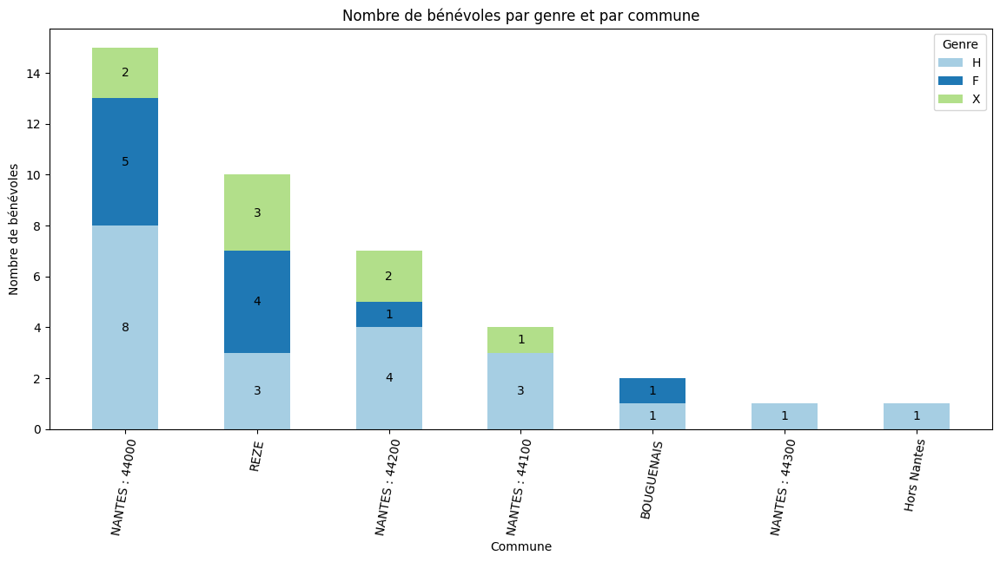

In [83]:
fig, ax = plt.subplots(figsize=(14,6))
bottom = np.zeros(len(commune_bene.drop('Total', axis=0).index), dtype='int64')

# Зададим нужный порядок вывода столбцов для наглядности
for column in ['H', 'F', 'X']:
    montant = commune_bene[column].drop('Total', axis=0).to_list()
    p = ax.bar(x=commune_bene.drop('Total', axis=0).index.to_list(),
               height=montant,
               label=column,
               bottom=bottom,
               color=GENRE_COLORS[column],
               log=False,
               width=0.5);
    bottom += montant
    # В лейблах баров заменим нули на np.nan, чтобы они не выводились на график
    p.datavalues = np.array([np.nan if elem == 0 else elem for elem in p.datavalues])
    ax.bar_label(p, label_type='center')
    
ax.legend(title='Genre', loc="upper right");
ax.set(title="Nombre de bénévoles par genre et par commune",
       xlabel="Commune",
       ylabel="Nombre de bénévoles");
ax.tick_params(axis='x', labelrotation=80, labelsize=10);

## 5. Relationship of volunteer, amount of fee, gender and age?  

In [84]:
# Соотношение участников, добровольцев и общей суммы по комуннам
overall = df.pivot_table(
    index='Nantes_quartier',
    columns='Genre',
    values=['Bénévole', 'Montant', 'ID'],
    aggfunc={'ID': 'count', 'Montant': 'sum', 'Bénévole': 'sum'},
    margins = True,
    margins_name='Total',
    fill_value = 0
).sort_values(by=('ID', 'Total'), ascending=False)

# Поместим колонку с кол-вом участников в конец таблицы
overall = pd.concat([overall, overall[['ID']].rename(columns={'ID': 'Participants'})], axis=1)
overall.drop('ID', axis=1, inplace=True)

display('Соотношение участников, добровольцев и общей суммы по комуннам', overall)

'Соотношение участников, добровольцев и общей суммы по комуннам'

Bénévole              Montant                      \
Genre                         F   H  X Total       F      H     X  Total   
Nantes_quartier                                                            
Total                        11  21  8    40    5580  10830  1532  17942   
NANTES : 44000                5   8  2    15    2282   4231   500   7013   
NANTES : 44200                1   4  2     7    1009   2114   264   3387   
NANTES : 44100                0   3  1     4     583   1380   160   2123   
REZE                          4   3  3    10     380   1024   233   1637   
NANTES : 44300                0   1  0     1     550    767   169   1486   
Hors Nantes                   0   1  0     1     144    317    70    531   
ST SEBASTIEN SUR LOIRE        0   0  0     0     208    380    10    598   
N/A                           0   0  0     0      50     82    20    152   
BOUGUENAIS                    1   1  0     2     100    160    56    316   
ST HERBLAIN                   0   0  0     0     100    135    10    245   
VERTOU                        0   0  0     0      35     70    10    115   
THOUARE SUR LOIRE             0   0  0     0      26     50     0     76   
ORVAULT                       0   0  0     0      40     20     0     60   
BASSE GOULAINE                0   0  0     0       0     70     0     70   
ST AIGNAN GRANDLIEU           0   0  0     0      10      0    30     40   
LA CHAPELLE SUR ERDRE         0   0  0     0      50      0     0     50   
ST JEAN DE BOISEAU            0   0  0     0       0     30     0     30   
LES SORINIERES                0   0  0     0      10      0     0     10   
LA MONTAGNE                   0   0  0     0       0      0     0      0   
INDRE                         0   0  0     0       3      0     0      3   

                       Participants                 
Genre                             F    H   X Total  
Nantes_quartier                                     
Total                           317  571  91   979  
NANTES : 44000                  137  234  33   404  
NANTES : 44200                   56  106  11   173  
NANTES : 44100                   31   70   8   109  
REZE                             21   46  14    81  
NANTES : 44300                   28   39   9    76  
Hors Nantes                      14   24   8    46  
ST SEBASTIEN SUR LOIRE            9   19   1    29  
N/A                               4    7   2    13  
BOUGUENAIS                        3    7   2    12  
ST HERBLAIN                       3    6   1    10  
VERTOU                            2    4   1     7  
THOUARE SUR LOIRE                 3    2   0     5  
ORVAULT                           1    2   0     3  
BASSE GOULAINE                    0    3   0     3  
ST AIGNAN GRANDLIEU               1    0   1     2  
LA CHAPELLE SUR ERDRE             2    0   0     2  
ST JEAN DE BOISEAU                0    1   0     1  
LES SORINIERES                    1    0   0     1  
LA MONTAGNE                       0    1   0     1  
INDRE                             1    0   0     1

In [85]:
print('Montant moyen et médian\ndes contributions par genre :')
df.groupby('Genre')['Montant'].agg(['mean', 'median'])

Montant moyen et médian
des contributions par genre :


,mean,median
Genre,,
F,17.602524,10.0
H,18.966725,20.0
X,16.835165,10.0


> A person who does not specify gender gives less on average than those who do specify gender.

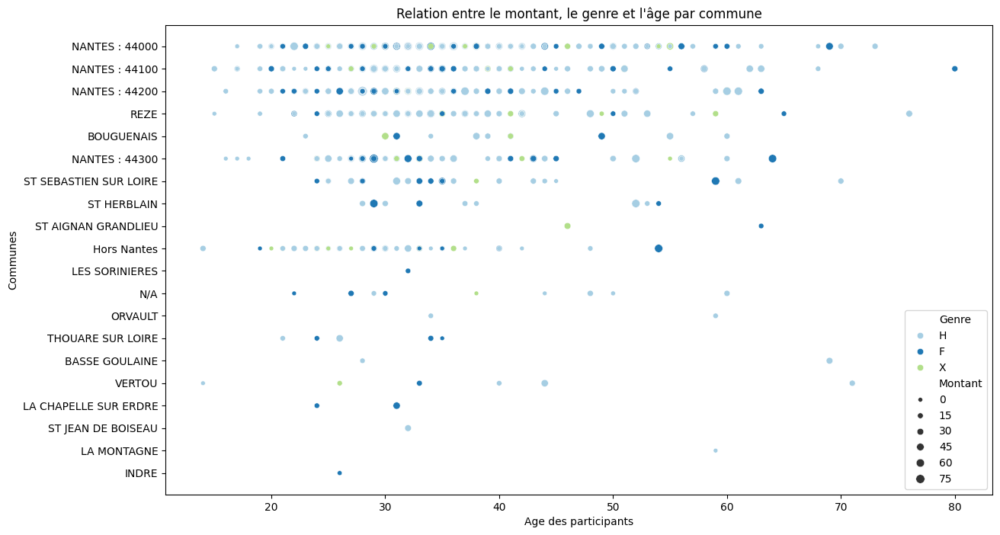

In [86]:
fig = plt.figure(figsize=(14,8))
scatterplot = sns.scatterplot(
    data=df,
    y='Nantes_quartier',
    x='Age',
    size='Montant',
    # style='Genre',
    hue='Genre',
    palette='Paired'
)
scatterplot.set_title("Relation entre le montant, le genre et l'âge par commune");
scatterplot.set_ylabel('Communes');
scatterplot.set_xlabel("Age des participants");
# scatterplot.tick_params(axis='x', labelrotation=80, labelsize=10);

In [87]:
df.groupby('Bénévole')['Montant'].agg(['min', 'mean', 'median', 'max']).round(2).rename({False: 'Non', True: 'Oui'}, axis=0)

,min,mean,median,max
Bénévole,,,,
Non,0,18.14,15.0,80
Oui,0,22.62,20.0,60


In [88]:
mean_montant = df.pivot_table(
    index='Bénévole',
    columns='Genre',
    values='Montant',
    aggfunc='median'
).round(2)
mean_montant.index = ['Non', 'Oui']
print('Participation median par statut\nde bénévole et par genre :')
mean_montant

Participation median par statut
de bénévole et par genre :


Genre,F,H,X
Non,10,20,10
Oui,20,20,20


In [89]:
mean_montant = df.pivot_table(
    index='Bénévole',
    columns='Genre',
    values='Montant',
    aggfunc='mean'
).round(2)
mean_montant.index = ['Non', 'Oui']
print('Participation moyenne par statut\nde bénévole et par genre :')
mean_montant

Participation moyenne par statut
de bénévole et par genre :


Genre,F,H,X
Non,17.60,18.76,16.05
Oui,17.73,24.29,25.00


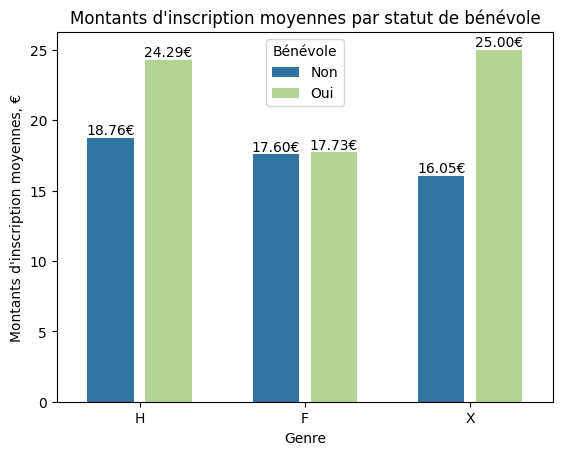

In [90]:
# fig = plt.figure(figsize=(14,6))
barplot = sns.barplot(
    df,
    x='Genre',
    y='Montant',
    hue='Bénévole',
    errorbar=None,
    dodge='auto',
    palette=list(GENRE_COLORS.values())[1:],
    width=.7,
    gap=.2,
    estimator='mean'
);
# barplot.tick_params(axis='x', labelrotation=80, labelsize=10);
barplot.set_title("Montants d'inscription moyennes par statut de bénévole");
barplot.set_xlabel('Genre');
barplot.set_ylabel("Montants d'inscription moyennes, €");
# barplot.legend('Bénévole', ['Non', 'Oui']);
barplot.legend(['Non', 'Oui'], title='Bénévole', loc='upper center')
for container in barplot.containers:
    barplot.bar_label(container, fmt='%.2f€');

## 6. Relationship of gender, age, commune of participants  

In [91]:
df_nombre_montant = df[df['YOB_inv'] == False]
df_nombre_montant = df_nombre_montant.groupby('MOB_num')[['MOB_num', 'Montant']].\
    agg({'MOB_num': 'count', 'Montant': ['sum', 'median', 'mean']}).round(2)
df_nombre_montant.index = MONTHS_LIST[1:]
print("Nombre de participants et montants\nd'inscription par mois de naissance :")
display(df_nombre_montant)

Nombre de participants et montants
d'inscription par mois de naissance :


MOB_num Montant              
      count     sum median   mean
Jan      71    1384   20.0  19.49
Feb      72    1465   16.0  20.35
Mar      71    1272   15.0  17.92
Apr      85    1413   16.0  16.62
May      76    1359   10.0  17.88
Jun      88    1646   15.0  18.70
Jul      79    1353   15.0  17.13
Aug      68    1219   12.5  17.93
Sep      79    1547   20.0  19.58
Oct      65    1309   13.0  20.14
Nov      80    1549   17.5  19.36
Dec      76    1357   15.0  17.86

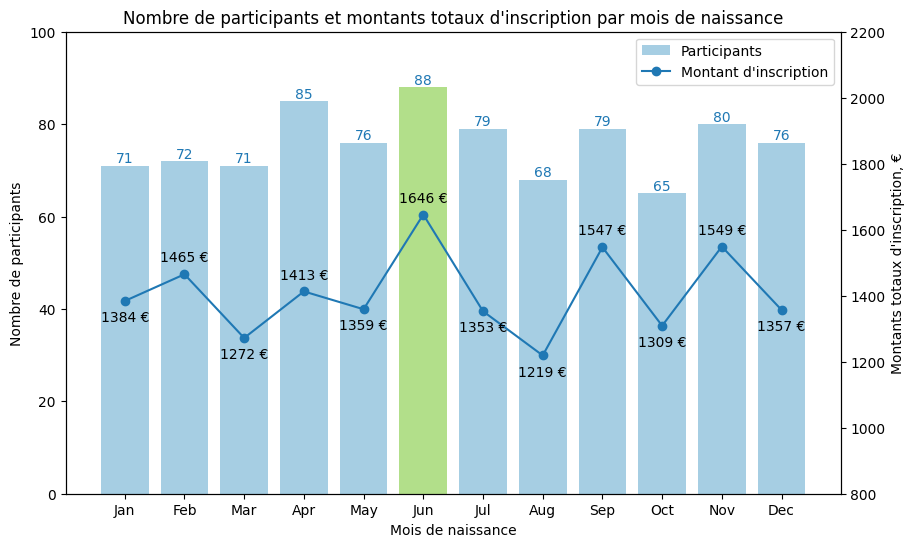

In [112]:
fig, ax1 = plt.subplots(figsize=(10,6))
ax2 = ax1.twinx()

colors = [GENRE_COLORS['H'] for i in range(12)]
colors[5] = GENRE_COLORS['X']
p1 = ax1.bar(x=df_nombre_montant.index.to_list(),
             height=df_nombre_montant[('MOB_num', 'count')],
             label='Participants',
             color=colors,
             width=0.8
)
ax1.set(ylim=(0, 100), xlabel='Mois de naissance', ylabel='Nombre de participants')
ax1.bar_label(p1, label_type='edge', color=GENRE_COLORS['F'])

p2, = ax2.plot(df_nombre_montant[('Montant', 'sum')],
        label="Montant d'inscription",
        marker='o',
        color=GENRE_COLORS['F']
)
ax2.set(ylim=(800, 2200), ylabel="Montants totaux d'inscription, €")
for x, y in zip(df_nombre_montant.index.to_list(), df_nombre_montant[('Montant', 'sum')]): 
    plt.text(x, y, str(y)+' €', ha='center', va='center',
             position=(x, (y+50 if y > 1400 else y-50)))

ax1.legend(handles=[p1, p2])
ax1.set_title("Nombre de participants et montants totaux d'inscription par mois de naissance");
plt.show()

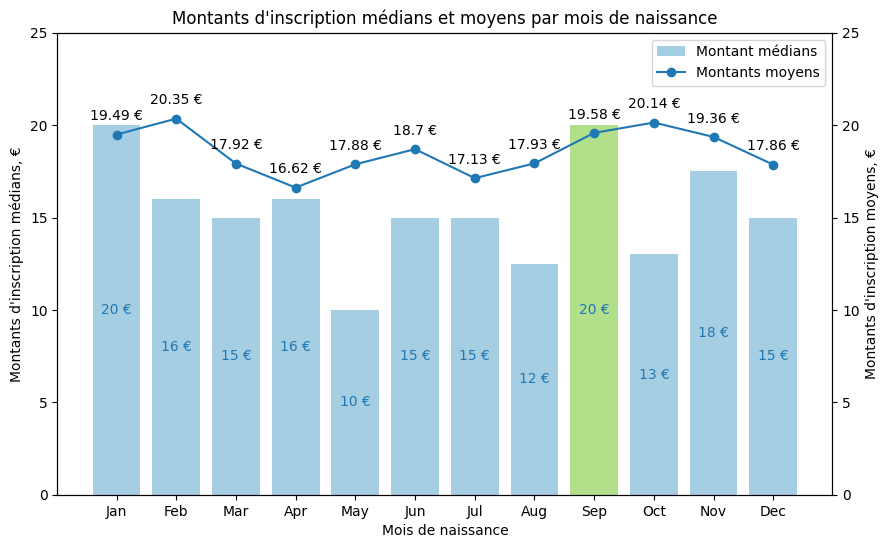

In [93]:
fig, ax1 = plt.subplots(figsize=(10,6))
ax2 = ax1.twinx()

colors = [GENRE_COLORS['H'] for i in range(12)]
colors[8] =  GENRE_COLORS['X']
p1 = ax1.bar(x=df_nombre_montant.index.to_list(),
             height=df_nombre_montant[('Montant', 'median')],
             label='Montant médians',
             color=colors,
             width=0.8
)
ax1.set(ylim=(0, 25), xlabel='Mois de naissance', ylabel="Montants d'inscription médians, €")
ax1.bar_label(p1, fmt='%.0f €', label_type='center', color=GENRE_COLORS['F'])

p2, = ax2.plot(df_nombre_montant[('Montant', 'mean')],
        label="Montants moyens",
        marker='o',
        color=GENRE_COLORS['F']
)
ax2.set(ylim=(0, 25), ylabel="Montants d'inscription moyens, €")
for x, y in zip(df_nombre_montant.index.to_list(), df_nombre_montant[('Montant', 'mean')]): 
    plt.text(x, y, str(y)+' €', ha='center', va='center', position=(x, y+1))

ax1.legend(handles=[p1, p2])
ax1.set_title("Montants d'inscription médians et moyens par mois de naissance");
plt.show()

> Bien que le plus grand nombre de participants ayant indiqué leur mois de naissance soient nés en juin et en avril, les cotisations médianes les plus élevées sont celles des personnes nées en janvier et en septembre, et les cotisations moyennes sont celles des personnes nées en février et en octobre. Parmi les cotisations médianes les plus faibles, on trouve celles des personnes nées en mai. Étant donné que le paiement de l'adhésion à l'atelier est effectué en septembre, on peut supposer que les personnes nées pendant les périodes automnales en prévision de cadeaux de la part d'êtres chers sont plus enclines à effectuer des paiements généreux, de même que celles dont l'anniversaire tombe pendant les mois d'hiver lointains. Ceux qui sont nés en été peuvent avoir dépensé pour des célébrations et des vacances, et sont donc limités en termes de fonds.

## 7. Relationship of the amount of the contribution and the month of registration of the participant  

In [109]:
df_mois_montant = df.groupby('MOI')['Montant'].agg(['count', 'min', 'mean', 'median', 'max', 'sum']).round(2)
df_mois_montant.index = MONTHS_LIST[1:]
print("Nombre de participants et montants d'inscription \npar mois d'inscription :")
display(df_mois_montant)

Nombre de participants et montants d'inscription 
par mois d'inscription :


,count,min,mean,median,max,sum
Jan,40,1,22.22,17.5,80,889
Feb,73,5,19.66,20.0,60,1435
Mar,39,0,18.79,20.0,50,733
Apr,81,0,16.43,10.0,60,1331
May,79,0,15.51,10.0,40,1225
Jun,68,0,14.76,10.0,60,1004
Jul,87,0,14.26,10.0,60,1241
Aug,66,0,20.83,20.0,70,1375
Sep,174,0,21.11,20.0,60,3674
Oct,130,0,19.84,18.0,60,2579


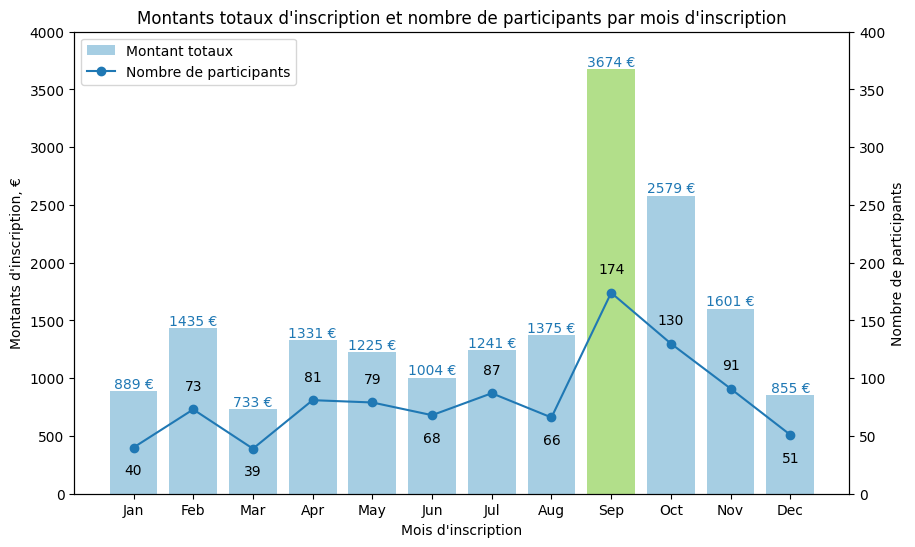

In [144]:
fig, ax1 = plt.subplots(figsize=(10,6))
ax2 = ax1.twinx()

colors = [GENRE_COLORS['H'] for i in range(12)]
colors[8] = GENRE_COLORS['X']
p1 = ax1.bar(x=df_mois_montant.index.to_list(),
             height=df_mois_montant['sum'],
             label='Montant totaux',
             color=colors,
             width=0.8
)
ax1.set(ylim=(0, 4000), xlabel="Mois d'inscription", ylabel="Montants d'inscription, €")
ax1.bar_label(p1, fmt='%.0f €', label_type='edge', color=GENRE_COLORS['F'])

p2, = ax2.plot(df_mois_montant['count'],
        label="Nombre de participants",
        marker='o',
        color=GENRE_COLORS['F']
)
ax2.set(ylim=(0, 400), ylabel="Nombre de participants")
for x, y in zip(df_mois_montant.index.to_list(), df_mois_montant['count']): 
    plt.text(x, y, str(y), ha='center', va='center',
             position=(x, (y+20 if y > 68 else y-20)))


ax1.legend(handles=[p1, p2])
ax1.set_title("Montants totaux d'inscription et nombre de participants par mois d'inscription");
plt.show()

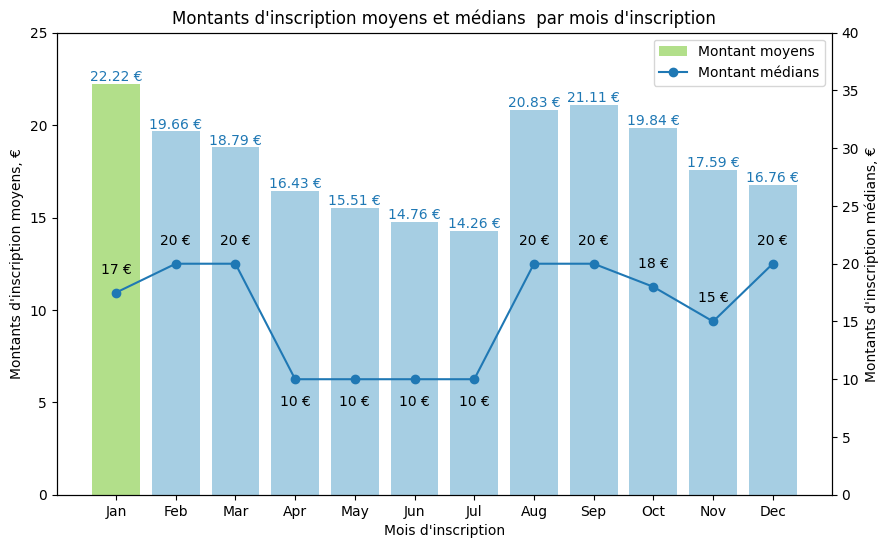

In [140]:
fig, ax1 = plt.subplots(figsize=(10,6))
ax2 = ax1.twinx()

colors = [GENRE_COLORS['H'] for i in range(12)]
colors[0] = GENRE_COLORS['X']
p1 = ax1.bar(x=df_mois_montant.index.to_list(),
             height=df_mois_montant['mean'],
             label='Montant moyens',
             color=colors,
             width=0.8
)
ax1.set(ylim=(0, 25), xlabel="Mois d'inscription", ylabel="Montants d'inscription moyens, €")
ax1.bar_label(p1, fmt='%.2f €', label_type='edge', color=GENRE_COLORS['F'])

p2, = ax2.plot(df_mois_montant['median'],
        label='Montant médians',
        marker='o',
        color=GENRE_COLORS['F']
)
ax2.set(ylim=(0, 40), ylabel="Montants d'inscription médians, €")
for x, y in zip(df_mois_montant.index.to_list(), df_mois_montant['median']): 
    plt.text(x, y, str(int(y))+' €', ha='center', va='center',
             position=(x, (y+2 if y > 10 else y-2)))

ax1.legend(handles=[p1, p2])
ax1.set_title("Montants d'inscription moyens et médians  par mois d'inscription");
plt.show()

# 4. Merging the dataframe with data from geojson files  
In this section we will download geojson files with OpenStreetMap maps of the neighborhoods of Nantes, as well as the communes around Nantes. We will then merge these data with each other and add them to the original dataframe. This will allow us to combine the 11 districts of Nantes into 4 large districts by postal code (which the participants indicated in their questionnaires).  
In this way, we will end up with a map with the outlines of all the communes around Nantes, as well as the 4 major districts of Nantes from where participants come to Atelier. And in the next section we will be able to map the analyzed data onto this merged map.  

In [95]:
# Попробуем нанести на карту центры коммун Нанта
print('Centres géographiques des communes de Nantes métropole')
fig = px.scatter_map(df, lat="center_lat", lon="center_lon", hover_name="Nantes_quartier", hover_data=["Nantes_quartier", "Montant"],
                        color_discrete_sequence=["fuchsia"], zoom=10, height=500)

fig.update_layout(map_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

Centres géographiques des communes de Nantes métropole


## 4.1. Districts of Nantes  

In [3]:
with open('data/244400404_quartiers-communes-nantes-metropole.geojson', 'r') as file:
    geojson_quartiers = geojson.load(file)

if len(geojson_quartiers) == 0:
    print('Ошибка в чтении файла')

In [109]:
geo_quartiers = pd.read_csv('244400404_quartiers-communes-nantes-metropole.csv', sep=';')
display(geo_quartiers.head(5))

,Commune,Quartier,Identifiant,Code commune,Géométrie
0,Les Sorinières,Centre,19802,440198.0,"{""coordinates"": [[[-1.51865810020662, 47.14645..."
1,Orvault,Bugallière/Madoire/Bois-Jouan,11402,440114.0,"{""coordinates"": [[[-1.64447216402277, 47.27017..."
2,Les Sorinières,Est,19806,440198.0,"{""coordinates"": [[[-1.51107220166612, 47.15880..."
3,Saint-Herblain,Est,16203,440162.0,"{""coordinates"": [[[-1.61712949623655, 47.19980..."
4,Nantes,Nantes Sud,11,440109.0,"{""coordinates"": [[[-1.52769982017493, 47.20121..."


Correspondance of features in geojson files and in the dataframe:  

|JSON features|csv|
|---|---|
|libcom|Commune|
|nom|Quartier|
|**idobj**|**Identifiant**|
|codcom|Code commune|  


In [ ]:
fig = px.choropleth_map(geo_quartiers, geojson=geojson_quartiers, color="Code commune",
                           locations="Identifiant", featureidkey="properties.idobj",
                           center=ATELIER_COORDS,
                           opacity = 0.5,
                           map_style="open-street-map", zoom=10, height=500)
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

## 4.2. Communes around Nantes  

In [111]:
geo_communes = pd.read_csv('244400404_communes-nantes-metropole.csv', sep=';')
display(geo_communes.tail(5))

,OBJECTID,Code commune,Identifiant INSEE,Date de mise à jour,Commune,Toponyme,Géométrie
19,27,440020,44020,2022-11-15,BOUGUENAIS,Bouguenais,"{""coordinates"": [[[-1.66673531855442, 47.18846..."
20,32,440074,44074,2022-11-15,INDRE,Indre,"{""coordinates"": [[[-1.6949907087039, 47.199730..."
21,33,440094,44094,2022-11-15,MAUVES-SUR-LOIRE,Mauves-sur-Loire,"{""coordinates"": [[[-1.39597624307165, 47.28494..."
22,35,440109,44109,2022-11-15,NANTES,Nantes,"{""coordinates"": [[[-1.48445046936643, 47.23294..."
23,41,440166,44166,2022-11-15,SAINT-JEAN-DE-BOISEAU,Saint-Jean-de-Boiseau,"{""coordinates"": [[[-1.69453850516608, 47.19892..."


In [112]:
with open('244400404_communes-nantes-metropole.geojson', 'r') as file:
    geojson_communes = geojson.load(file)

if len(geojson_communes) == 0:
    print('Ошибка в чтении файла')

Correspondance of features:  
|GeoJSON_communes|csv|
|---|---|
|objectid|OBJECTID|
|idobj|Code commune|
|id_insee|Identifiant INSEE|
|maj_date|Date de mise à jour (deleted upon file loading)|
|**nom**|**Commune**|
|toponyme|Toponyme|  


In [ ]:
fig = px.choropleth_map(geo_communes, geojson=geojson_communes, color="Code commune",
                           locations="Commune", featureidkey="properties.nom",
                           center=ATELIER_COORDS,
                           opacity = 0.5,
                           map_style="open-street-map", zoom=10, height=500)
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

## 4.3. Combining coordinates of districts and communes into one geojson file  
1. The first step is to merge the small districts of Nantes into larger ones, with zip codes 44000, 41000, .... To this end, we will combine the polygons of the geojson file of the small neighborhoods into multipolygons. To create the multipolygons of each Nantes neighborhood, we will run a loop on the 4 large neighborhoods, then on the small neighborhoods inside. By the name of the small neighborhood we will take the index from the dataframe, because it corresponds to the number of the record in the geojson-file. And from it we will take the coordinates.  
2. When creating each multipolygon and Feature, we will add it to the geojson file immediately. It makes sense to add the large districts of Nantes immediately to the communes file, because this is the final goal: a map with the boundaries of the communes, among which Nantes is divided into 4 large districts. The choice of the file determines the set of properties. In the Feature creation function, we will provide two options for properties: for the districts file and for the communes file (we will comment out the first option).  
3. After adding Feautre to the geojson file, let's immediately add an entry to the dataframe as well.  
4. Finally, we remove unnecessary records from the file and from the dataframe: for districts, these are 11 districts, and for communes, only one commune of Nantes. We'll hen display the communes on the map.  
5. As INSEE code for the 4 created “communes” of Nantes with codes 44000, 44100.... we will use instead of general code 44109 the following:  
  
    |Code postal|Code INSEE|  
    |---|---|  
    |44000|44900*|  
    |44100|44109|  
    |44200|44209|  
    |44300|44309|  
  
    \* The INSEE code 44900 was assigned to code 44000 because 44009 belonged to another commune, Basse Goulaine.  
    The same changes will be made to the main dataframe for merging purposes. 

Correspondance of columns:  

|JSON districts|csv|JSON communes|csv|
|---|---|---|---|
|libcom|Commune|**nom**|**Commune**|  
|nom|Quartier|toponyme|Toponyme|  
|**idobj**|**Identifiant**|objectid|OBJECTID|  
|codcom|Code commune|idobj|Code commune|  
|||id_insee|Identifiant INSEE|
|||maj_date|Date de mise à jour|


First of all, let's look at the dataframe columns to remove unnecessary ones and decide which properties we will pass to Features.  
For the dataframe and the districts file, we can leave them unchanged, but shorten them for the communes.  

In [115]:
# Эти столбцы не пригодятся при слиянии с главным dataframe
geo_communes.drop(['OBJECTID', 'Date de mise à jour', 'Toponyme'], axis=1, inplace=True)

**Districts of Nantes:**  
- 40000:  
    - 1, Centre Ville  
    - 4, Hauts Pavés - Saint Félix  
    - 5, Malakoff - Saint-Donatien  
- 41000:  
    - 2, Bellevue - Chantenay - Sainte Anne  
    - 3, Dervallières - Zola  
- 42000:  
    - 6, Ile de Nantes  
    - 11, Nantes Sud  
- 43000:  
    - 7, Breil - Barberie  
    - 8, Nantes Nord  
    - 9, Nantes Erdre  
    - 10, Doulon - Bottière  


In [ ]:
# Выделим из dataframe только районы Нанта
geo_nantes = geo_quartiers[geo_quartiers['Commune'] == 'Nantes']
geo_nantes

,Commune,Quartier,Identifiant,Code commune,Géométrie
4,Nantes,Nantes Sud,11,440109.0,"{""coordinates"": [[[-1.52769982017493, 47.20121..."
5,Nantes,Doulon - Bottière,10,440109.0,"{""coordinates"": [[[-1.4940689469221, 47.260307..."
9,Nantes,Malakoff - Saint-Donatien,5,440109.0,"{""coordinates"": [[[-1.53602017078444, 47.23384..."
17,Nantes,Breil - Barberie,7,440109.0,"{""coordinates"": [[[-1.57440058466757, 47.24547..."
28,Nantes,Nantes Nord,8,440109.0,"{""coordinates"": [[[-1.58660822980291, 47.27407..."
29,Nantes,Ile de Nantes,6,440109.0,"{""coordinates"": [[[-1.51850796339839, 47.21054..."
30,Nantes,Nantes Erdre,9,440109.0,"{""coordinates"": [[[-1.52077853895932, 47.29582..."
39,Nantes,Hauts Pavés - Saint Félix,4,440109.0,"{""coordinates"": [[[-1.55001720841912, 47.24301..."
46,Nantes,Dervallières - Zola,3,440109.0,"{""coordinates"": [[[-1.59460425528411, 47.22667..."
48,Nantes,Centre Ville,1,440109.0,"{""coordinates"": [[[-1.55052496477627, 47.22092..."


In [117]:
# Напишем фунцию создания МультиПолигона и Черты
def create_feature(polygons_list: list, quartier_name, id: str) -> geojson.Feature:
    """This function receives a list of geojson-Polygons and converts then
    into a MultiPolygon and then produces and returns a geojson Feature.

    Args:
        polygons_list (list): a list of geojson Polygons
        quartier_name (_type_): a new quartier name for geojson properties
        id (str): a new idobj for geojson properties as str because int is not allowed by JSON

    Returns:
        geojson.Feature: a new Feature, containing a MultiPolygon
    """

    # Create a MultiPolygon
    mul_poly = geojson.MultiPolygon(polygons_list, precision=14)
    if len(mul_poly.errors()) > 0:
        print('Errors while creating MultiPolygon:', mul_poly.errors())
    
    """
    # *** Create a Feature for quartiers file and df ***
    feature = geojson.Feature(geometry=mul_poly,
                              properties={'libcom': 'Nantes',
                                          'nom': quartier_name,
                                          'idobj': id,
                                          'codcom': 440109.0})
    """
    # *** Create a Feature for communes file and df ***
    feature = geojson.Feature(geometry=mul_poly,
                              properties={'idobj': id, # Code commune equals code INSEE for simplicity
                                          'id_insee': id,
                                          'nom': quartier_name})
    
    
    if len(feature.errors()) > 0:
        print('Errors while creating Feature:', feature.errors())

    return feature

In [118]:
# *** Данный код касается обновление geojson-файла и df коммун (communes) ***
# Воспользуемся листом соответствия кодов коммуны и INSEE, созданным в самом начале
# INSEE_ID_LIST : dict(zip(NANTES_QUARTIERS.keys(), [44900, 44109, 44209, 44309]))

# Запускаем цикл по крупным районам Нанта: 44000, 44100, ..
for cp, qrts in NANTES_QUARTIERS.items():
    poly_list = [] # пустой список для хранения полигонов
    # Запускаем цикл по мелким районам
    for q in qrts:
        ind = geo_nantes[geo_nantes['Quartier'] == q].index.to_list()[0] # получаем номер записи (совпадает с индексом в df)
        poly_list.append([list(geojson.utils.coords(geojson_quartiers['features'][ind]))]) # добавляем координаты полигона в список
    # Передаем все в функцию и получам Черту с МультиПолигоном
    feature = create_feature(polygons_list=poly_list,
                             quartier_name=f'NANTES : {str(cp)}',
                             id=str(INSEE_ID_LIST[cp]))
    
    # Добавим новую черту в конец списка geojson-файла
    geojson_communes['features'].append(feature)

    # Добавим новую запись в dataframe всех коммун метрополии
    # Создаем запись
    new_quartier = list(feature['properties'].values())
    new_quartier.append(str(feature['geometry']))
    new_quartier = [int(x) if x.isdigit() else x for x in new_quartier] #  все числовые типы преобразуем в int
    # Добавляем в dataframe
    geo_communes = pd.concat([geo_communes,
                              pd.DataFrame(data=[new_quartier],
                                           columns=geo_communes.columns)],
                              axis=0,
                              ignore_index=True)
    
# Удалим полигон коммуны Нанта из geojson-файла по индексу из dataframe
ind = geo_communes[geo_communes['Commune'] == 'NANTES'].index[0] # Получим индекс записи
geojson_communes['features'].remove(geojson_communes['features'][ind])

# Удалим из dataframe всех коммун метрополии запис о коммуне Нанта
geo_communes = geo_communes.drop(ind, axis=0).reset_index(drop=True)

# Сохраним получившийся dataframe в файл
geo_communes.to_csv('my_communes-nantes-metropole.csv', sep=';', index=False)

# Сохраним получившийся geojson-файл
with open('my_communes-nantes-metropole.geojson', 'w') as file:
    geojson.dump(geojson_communes, file)

In [119]:
# *** Данный код касается обновление geojson-файла и df районов (quartiers) ***
"""
# Зададим номера id для новых крупных районов - только для файла районов
identifiant = geo_nantes['Identifiant'].max()

# Запускаем цикл по крупным районам Нанта: 44000, 44100, ..
for cp, qrts in NANTES_QUARTIERS.items():
    identifiant += 1 # увеличим на 1, чтобы индекс не повторялся
    poly_list = [] # пустой список для хранения полигонов
    # Запускаем цикл по мелким районам
    for q in qrts:
        ind = geo_nantes[geo_nantes['Quartier'] == q].index.to_list()[0] # получаем номер записи (совпадает с индексом в df)
        poly_list.append([list(geojson.utils.coords(geojson_quartiers['features'][ind]))]) # добавляем координаты полигона в список
    
    # Передаем все в функцию и получам Черту с МультиПолигоном
    feature = create_feature(polygons_list=poly_list,
                             quartier_name=f'NANTES : {str(cp)}',
                             id=str(identifiant))

    # Добавим новую черту в конец списка geojson-файла
    geojson_quartiers['features'].append(feature)

    # Добавим новую запись в dataframe всех районов метрополии
    # Создаем запись
    new_quartier = list(feature['properties'].values())
    new_quartier.append(str(feature['geometry']))
    new_quartier[2] = int(new_quartier[2])
    # Добавляем в dataframe
    geo_quartiers = pd.concat([geo_quartiers,
                               pd.DataFrame(data=[new_quartier],
                                            columns=geo_quartiers.columns)],
                               axis=0,
                               ignore_index=True)

# Удалим полигоны из geojson-файла по индексу всех мелких районов из dataframe
for i in geo_nantes.index.sort_values(ascending=False):
    geojson_quartiers['features'].remove(geojson_quartiers['features'][i])
# Удалим из dataframe всех районов метрополии записи о маленьких районах Нанта
geo_quartiers = geo_quartiers.drop(geo_nantes.index, axis=0).reset_index(drop=True)
"""

"\n# Зададим номера id для новых крупных районов - только для файла районов\nidentifiant = geo_nantes['Identifiant'].max()\n\n# Запускаем цикл по крупным районам Нанта: 44000, 44100, ..\nfor cp, qrts in NANTES_QUARTIERS.items():\n    identifiant += 1 # увеличим на 1, чтобы индекс не повторялся\n    poly_list = [] # пустой список для хранения полигонов\n    # Запускаем цикл по мелким районам\n    for q in qrts:\n        ind = geo_nantes[geo_nantes['Quartier'] == q].index.to_list()[0] # получаем номер записи (совпадает с индексом в df)\n        poly_list.append([list(geojson.utils.coords(geojson_quartiers['features'][ind]))]) # добавляем координаты полигона в список\n    \n    # Передаем все в функцию и получам Черту с МультиПолигоном\n    feature = create_feature(polygons_list=poly_list,\n                             quartier_name=f'NANTES : {str(cp)}',\n                             id=str(identifiant))\n\n    # Добавим новую черту в конец списка geojson-файла\n    geojson_quartiers['fe

In [ ]:
fig_margin = 30
fig = px.choropleth_map(data_frame=geo_communes,
                        geojson=geojson_communes,
                        locations='Commune',
                        featureidkey='properties.nom',
                        hover_name='Commune',
                        hover_data={'Commune': False, 'Identifiant INSEE': True},
                        color='Commune',
                        opacity = 0.5,
                        # color_continuous_scale='sunset',
                        map_style='open-street-map',
                        center=ATELIER_COORDS,
                        title='Communes de Nantes metropole',
                        zoom=10, height=600)
fig.update_layout(margin={"r":0,"t":fig_margin,"l":0,"b":0})
fig.show()

## 4.4. Combining coordinates of districts and communes with the main DataFrame  
1. First convert the INSEE column in the main df.  
2. After merging, only the `Commune` column from the geojson df will be retained.  

In [121]:
# Прочитаем сохранненые ранее файлы, чтобы продолжить работу
# geo_communes = pd.read_csv('my_communes-nantes-metropole.csv', sep=';')
print('Записей в датафрейме: ', geo_communes.shape[0])

# Прочитаем geojson-файл
# with open('my_communes-nantes-metropole.geojson', 'r') as file:
    # geojson_communes = geojson.load(file)
print('Записей в geojson: ', len(geojson_communes['features']))
print('Если совпадает, значит все открылось успешно.')

Записей в датафрейме:  27
Записей в geojson:  27
Если совпадает, значит все открылось успешно.


In [122]:
# Исправим INSEE в соответствии со списком соответствия большим районам Нанта 
# INSEE_ID_LIST : {44000: 44900, 44100: 44109, 44200: 44209, 44300: 44309}
df['INSEE'] = df[['Commune_CP', 'INSEE']].apply(lambda x: INSEE_ID_LIST.get(x[0], x[1]), axis=1)

In [123]:
# Объединим датафреймы
df_merged = pd.merge(
    left=df,
    right=geo_communes,
    left_on='INSEE',
    right_on='Identifiant INSEE',
    how='left'
)
# Заменим пустые значения на Hors Nantes и N/A, чтобы можно было использовать вместо Nantes_quartier
df_merged['Commune'] = df_merged[['Nantes_quartier', 'Commune']].\
    apply(lambda x: x[0] if x[1] is np.nan else x[1], axis=1)

df_merged.drop(['Code commune', 'Identifiant INSEE', 'Géométrie',   # удалим ненужные столбцы из geojson-df
                'Commune_CP', 'Commune_nom', 'Nantes_quartier'],    # а также дублирующие - их главного df
                axis=1, inplace=True)    
        
# Сохраним df, хотя при открытии он будет отличаться
# df_merged.to_csv('df_with_map.csv', index=False)

In [124]:
# df_merged = pd.read_csv('df_with_map.csv')
# df_merged

In [ ]:
fig_margin = 30
fig = px.choropleth_map(data_frame=df_merged,
                        geojson=geojson_communes,
                        locations='Commune',
                        featureidkey='properties.nom',
                        hover_name='Commune',
                        hover_data={'Commune': False},
                        color='Commune',
                        opacity = 0.5,
                        color_continuous_scale='sunset',
                        map_style='open-street-map',
                        center=ATELIER_COORDS,
                        title="Communes de Nantes metropole d'où viennent des participants",
                        zoom=10, height=600)
fig.add_traces(go.Scattermap(mode = 'markers',
                            lon = [ATELIER_COORDS['lon']],
                            lat = [ATELIER_COORDS['lat']],
                            marker = {'size': 14, 'symbol': 'circle', 'color': 'gold'},
                            showlegend = False))
fig.add_traces(go.Scattermap(mode = 'markers+text',
                            lon = [ATELIER_COORDS['lon']],
                            lat = [ATELIER_COORDS['lat']],
                            marker = {'size': 7, 'symbol': 'bicycle', 'color': 'gold'},
                            name = 'Cycle',
                            showlegend = False,
                            hoverinfo = 'text',
                            text = "Atelier du Pignon",
                            textfont = {'color': 'yellow', 'size': 12, 'style': 'normal', 'weight': 700},
                            textposition = 'top right'))
fig.update_layout(margin={'r':0, 't':fig_margin, 'l':0, 'b':0})
fig.show()

if SAVE_TO_FILES:
    fig.write_image('pics/Plotly_map_4_4_Communes.png', height=500, width=1080)
    fig.write_html('pics/Plotly_map_4_4_Communes.html')

![Communes de Nantes metropole](pics/Plotly_map_4_4_Communes.png)

# 5. Data analysis using Plotly and OpenStreetMaps  

## 5.1. Number of participants per commune

In [166]:
# cp_pie = round(df_merged['Commune'].value_counts(normalize=True).sort_values(ascending=False)*100, 2)
cp_pie = df_merged['Commune'].value_counts().sort_values(ascending=False)
print('Nombre de participants par commune :')
cp_pie.to_frame('Participants').head(5)

Nombre de participants par commune :


,Participants
NANTES : 44000,404
NANTES : 44200,173
NANTES : 44100,109
REZE,81
NANTES : 44300,76


In [174]:
fig_margin = 30
fig = px.choropleth_map(geojson=geojson_communes,
                        featureidkey='properties.nom',
                        data_frame=cp_pie.to_frame('Participants'),
                        locations=cp_pie.index,
                        hover_name='Participants',
                        hover_data={'Participants': False},
                        color='Participants',
                        opacity = 0.5,
                        color_continuous_scale='sunsetdark',
                        map_style='light', #'open-street-map',
                        center=ATELIER_COORDS,
                        title='Nombre de participants par commune',
                        zoom=10, height=500)
fig.add_traces(go.Scattermap(mode = 'markers+text',
                            lon = [ATELIER_COORDS['lon']],
                            lat = [ATELIER_COORDS['lat']],
                            marker = {'size': 7, 'symbol': 'circle', 'color': 'gold'},
                            name = 'Cycle',
                            showlegend = False,
                            hoverinfo = 'text',
                            text = "Atelier du Pignon",
                            textfont = {'color': 'gold', 'size': 12, 'style': 'normal', 'weight': 700},
                            textposition = 'top right'))
fig.update_layout(margin={'r':0, 't':fig_margin, 'l':0, 'b':0})
fig.show()

if SAVE_TO_FILES:
    fig.write_image('pics/Plotly_map_5_1_Participants.png', height=500, width=1080)
    fig.write_html('pics/Plotly_map_5_1_Participants.html')

## 5.2. Median, max. and min. age for each commune  

In [162]:
# Возраст по комуннам
commune_age = df_merged.pivot_table(
    index='Commune',
    values='Age',
    aggfunc=['min', 'median', 'mean', 'max', 'count'],
    fill_value = 0
).droplevel(1, axis=1).round(2)
commune_age = commune_age.sort_values(by='count', ascending=False)
commune_age.rename(columns={'count': 'Participants'}, inplace=True) # Переименуем для подписей
commune_age['Age max'] = commune_age['max'] # Добавим столбец для легенды
print('Возраст по комуннам')
display("Age maximum par commune", commune_age)

Возраст по комуннам


'Age maximum par commune'

,min,median,mean,max,Participants,Age max
Commune,,,,,,
NANTES : 44000,17,31.0,32.73,73,391,73
NANTES : 44200,16,31.0,32.34,63,170,63
NANTES : 44100,15,31.0,34.23,80,106,80
REZE,15,31.0,34.06,76,79,76
NANTES : 44300,16,30.0,33.33,64,72,64
Hors Nantes,14,26.5,28.61,54,46,54
SAINT-SEBASTIEN-SUR-LOIRE,24,35.0,36.74,70,27,70
BOUGUENAIS,23,38.5,39.92,60,12,60
SAINT-HERBLAIN,28,35.0,38.20,54,10,54


In [165]:
fig_margin = 30
fig = px.choropleth_map(geojson=geojson_communes,
                        featureidkey='properties.nom',
                        # изменения - ниже
                        data_frame=commune_age,
                        locations=commune_age.index,
                        hover_name='Age max',
                        hover_data={'min': True, 'median': True, 'mean': True,
                                    'max': True, 'Participants' : True, 'Age max': False},
                        color='Age max',
                        opacity = 0.6,
                        color_continuous_scale='bluyl',
                        map_style='light', #'open-street-map',
                        center=ATELIER_COORDS,
                        title="Age maximum par commune",
                        zoom=10, height=500)
fig.add_traces(go.Scattermap(mode = 'markers+text',
                            lon = [ATELIER_COORDS['lon']],
                            lat = [ATELIER_COORDS['lat']],
                            marker = {'size': 7, 'symbol': 'circle', 'color': 'gold'},
                            name = 'Cycle',
                            showlegend = False,
                            hoverinfo = 'text',
                            text = "Atelier du Pignon",
                            textfont = {'color': 'gold', 'size': 12, 'style': 'normal', 'weight': 700},
                            textposition = 'top right'))
fig.update_layout(margin={'r':0, 't':fig_margin, 'l':0, 'b':0})
fig.show()

if SAVE_TO_FILES:
    fig.write_image('pics/Plotly_map_5_2_Age.png', height=500, width=1080)
    fig.write_html('pics/Plotly_map_5_2_Age.html')

## 5.3. Which comune brought in the most/least money  

In [130]:
# Какая комунна принесла больше/меньше всего денег
commune_montant = df_merged.groupby('Commune')['Montant'].agg(['min', 'median', 'mean', 'max', 'sum']).round(2)
commune_montant = commune_montant.sort_values(by='sum', ascending=False)
commune_montant.rename(columns={'sum': 'Total, €'}, inplace=True) # Переименуем признак для легенды на графике
print('Размеры взносов по комуннам?')
display("Montants d'inscription par commune", commune_montant)


Размеры взносов по комуннам?


"Montants d'inscription par commune"

,min,median,mean,max,"Total, €"
Commune,,,,,
NANTES : 44000,0,15.0,17.36,60,7013
NANTES : 44200,0,15.0,19.58,80,3387
NANTES : 44100,0,20.0,19.48,60,2123
REZE,0,20.0,20.21,50,1637
NANTES : 44300,0,20.0,19.55,70,1486
SAINT-SEBASTIEN-SUR-LOIRE,0,20.0,20.62,60,598
Hors Nantes,0,10.0,11.54,60,531
BOUGUENAIS,10,20.0,26.33,40,316
SAINT-HERBLAIN,10,17.5,24.50,60,245


In [153]:
fig_margin = 30
fig = px.choropleth_map(geojson=geojson_communes,
                        featureidkey='properties.nom',
                        # изменения - ниже
                        data_frame=commune_montant,
                        locations=commune_montant.index,
                        hover_name='Total, €',
                        hover_data=['min', 'median', 'mean', 'max'],
                        color='Total, €',
                        opacity = 0.6,
                        color_continuous_scale='magenta',
                        map_style='light',
                        center=ATELIER_COORDS,
                        title="Montants totaux d'inscription par commune",
                        zoom=10, height=500)
fig.add_traces(go.Scattermap(mode = 'markers+text',
                            lon = [ATELIER_COORDS['lon']],
                            lat = [ATELIER_COORDS['lat']],
                            marker = {'size': 7, 'symbol': 'circle', 'color': 'gold'},
                            name = 'Cycle',
                            showlegend = False,
                            hoverinfo = 'text',
                            text = "Atelier du Pignon",
                            textfont = {'color': 'gold', 'size': 12, 'style': 'normal', 'weight': 700},
                            textposition = 'top right'))
fig.update_layout(margin={'r':0, 't':fig_margin, 'l':0, 'b':0})
fig.show()

if SAVE_TO_FILES:
    fig.write_image('pics/Plotly_map_5_3_Montant.png', height=500, width=1080)
    fig.write_html('pics/Plotly_map_5_3_Montant.html')

## 5.4. Which communes do volunteers come from

In [148]:
commune_bene = df_merged.groupby('Commune')['Bénévole'].sum().sort_values(ascending=False).to_frame('Bénévoles')

print('Добровольцы по комуннам')
display("Nombre de bénévoles par commune", commune_bene.head(8))

Добровольцы по комуннам


'Nombre de bénévoles par commune'

,Bénévoles
Commune,
NANTES : 44000,15
REZE,10
NANTES : 44200,7
NANTES : 44100,4
BOUGUENAIS,2
Hors Nantes,1
NANTES : 44300,1
THOUARE-SUR-LOIRE,0


In [151]:
fig_margin = 30
fig = px.choropleth_map(geojson=geojson_communes,
                        featureidkey='properties.nom',
                        # изменения - ниже
                        data_frame=commune_bene,
                        locations=commune_bene.index,
                        hover_name='Bénévoles',
                        color='Bénévoles',
                        opacity = 0.6,
                        color_continuous_scale='darkmint',
                        map_style='light',#'open-street-map',
                        center=ATELIER_COORDS,
                        title="Nombre de bénévoles par commune",
                        zoom=10, height=500)
fig.add_traces(go.Scattermap(mode = 'markers+text',
                            lon = [ATELIER_COORDS['lon']],
                            lat = [ATELIER_COORDS['lat']],
                            marker = {'size': 7, 'symbol': 'circle', 'color': 'gold'}, # bicycle
                            name = 'Cycle', # для легенды
                            showlegend = False,
                            hoverinfo = 'text',
                            text = "Atelier du Pignon",
                            textfont = {'color': 'gold', 'size': 12, 'style': 'normal', 'weight': 700},
                            textposition = 'top right'))
fig.update_layout(margin={'r':0, 't':fig_margin, 'l':0, 'b':0})
fig.show()

if SAVE_TO_FILES:
    fig.write_image('pics/Plotly_map_5_4_Bénévoles.png', height=500, width=1080)
    fig.write_html('pics/Plotly_map_5_4_Bénévoles.html')

# 6. Solving the classification problem  
During data analysis, we hypothesized that participants who did not indicate their gender (or indicated it as “X”) may actually be male on the simple grounds that the proportion of males is predominant among all participants. Furthermore, the size of the contributions of participants with gender X, and their propensity to volunteer, are strongly correlated with male behavior.  
It is now time to test this hypothesis by solving the classification problem. We will train several models on a dataframe that includes only women and men, and then feed in the portion of the dataframe represented only by gender X and look at the prediction.  

## 6.1. Data preparation  
1. Let's delete the columns: YOB, YOB_inv (after removing 42 records for which month and birthday were set), MOB_num, INSEE, center_lat, center_lon.  
2. Zero_montant will be left.  
3. Let's delete the rows with no data on month and day of birth (27 records), then fill the gaps in Age (7 records) with the median by gender.  

### 6.1.1. Removing skips

In [135]:
df_class = df_merged.copy()
df_class.head()

,ID,Genre,Bénévole,Montant,YOB,YOB_inv,MOB_num,MOB,DOB,Age,INSEE,Zero_montant,center_lat,center_lon,Distance,Commune
0,1,H,True,40,1990-04-28,False,4.0,Apr,28.0,34.0,44900,,47.232046,-1.548204,2.35,NANTES : 44000
1,2,H,False,40,1962-04-18,False,4.0,Apr,18.0,62.0,44109,,47.232046,-1.548204,2.35,NANTES : 44100
2,3,H,False,10,1980-04-07,False,4.0,Apr,7.0,44.0,44209,,47.232046,-1.548204,2.35,NANTES : 44200
3,4,H,False,0,2001-03-05,False,3.0,Mar,5.0,23.0,44209,RENOUVELLEMENT,47.232046,-1.548204,2.35,NANTES : 44200
4,5,F,True,20,1996-04-13,False,4.0,Apr,13.0,28.0,44143,,47.176656,-1.550014,3.90,REZE


In [136]:
ind = df_class[df_class['YOB_inv'] == True].index
df_class.drop(ind, axis=0, inplace=True)
print(f'Удалено {len(ind)} записей. Осталось: {df_class.shape[0]}.')

Удалено 42 записей. Осталось: 937.


In [137]:
df_class.drop(['YOB', 'YOB_inv', 'MOB', 'INSEE', 'center_lat', 'center_lon'], axis=1, inplace=True)
df_class.head(2)

,ID,Genre,Bénévole,Montant,MOB_num,DOB,Age,Zero_montant,Distance,Commune
0,1,H,True,40,4.0,28.0,34.0,,2.35,NANTES : 44000
1,2,H,False,40,4.0,18.0,62.0,,2.35,NANTES : 44100


In [138]:
df_class.isna().sum()

ID               0
Genre            0
Bénévole         0
Montant          0
MOB_num         27
DOB             27
Age             34
Zero_montant     0
Distance        53
Commune          0
dtype: int64

In [139]:
ind = df_class[df_class['MOB_num'].isna() == True].index
df_class.drop(ind, axis=0, inplace=True)
print(f'Удалено {len(ind)} записей. Осталось: {df_class.shape[0]}.')

Удалено 27 записей. Осталось: 910.


In [140]:
ind = df_class[df_class['Age'].isna() == True].index
df_class.loc[ind]

,ID,Genre,Bénévole,Montant,MOB_num,DOB,Age,Zero_montant,Distance,Commune
23,24,H,False,50,2.0,23.0,NaN,,2.35,NANTES : 44000
310,311,H,False,30,9.0,27.0,NaN,,6.03,BASSE-GOULAINE
443,444,F,False,20,4.0,23.0,NaN,,7.82,VERTOU
447,448,H,False,40,1.0,1.0,NaN,,2.35,NANTES : 44300
563,564,F,False,40,5.0,18.0,NaN,,9.31,ORVAULT
704,705,F,False,15,6.0,24.0,NaN,,2.35,NANTES : 44000
708,709,X,False,10,6.0,4.0,NaN,,2.35,NANTES : 44300


In [141]:
# Заменим пропуски в столбце Age на медиану согласно пола участника
for g in GENRE_COLORS.keys():
    i = df_class[df_class['Genre'] == g].index # Сохраним индекс строк с пропущенными значениями
    med_age = df_class.loc[i, 'Age'].median() # Вычислим медиану возраста
    df_class.loc[i, 'Age'] = df_class.loc[i, 'Age'].fillna(value=med_age, axis=0) # Заменим пропуски на медиану

if df_class['Age'].isna().sum() > 0:
    print('Не все пропуски заполнены. Проверить!')

In [142]:
# Заменим пропуски в расстоянии (для участников за пределами Нанта) на большое расстояние - 200 км
df_class['Distance'].fillna(value=200, axis=0, inplace=True)

In [143]:
df_class.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 910 entries, 0 to 978
Data columns (total 10 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   ID            910 non-null    int64  
 1   Genre         910 non-null    object 
 2   Bénévole      910 non-null    bool   
 3   Montant       910 non-null    int64  
 4   MOB_num       910 non-null    float64
 5   DOB           910 non-null    float64
 6   Age           910 non-null    float64
 7   Zero_montant  910 non-null    object 
 8   Distance      910 non-null    float64
 9   Commune       910 non-null    object 
dtypes: bool(1), float64(4), int64(2), object(3)
memory usage: 104.3+ KB


### Saving / reading the dataframe  

In [209]:
mode = ['READ', 'SAVE', '']
mode = mode[0]

if mode == 'SAVE':
    # Cохраним датафрейм
    df_class.to_csv('data/df_for_prediction.csv', sep=',', index=True, index_label='Index')
    print('Датафрейм успешно сохранен!')
elif mode == 'READ':
    # Прочтем датафрейм для возобновления работы
    df_class = pd.read_csv('data/df_for_prediction.csv', sep=',', index_col='Index')
    df_class.index.name = ''
    df_class['Zero_montant'] = df_class['Zero_montant'].apply(lambda x: '' if x is np.nan else x)
    df_class['Commune'] = df_class['Commune'].apply(lambda x: 'N/A' if x is np.nan else x)
    display(df_class.head())
else:
    print('Никаких действий не выполнено.')

,ID,Genre,Bénévole,Montant,MOB_num,DOB,Age,Zero_montant,Distance,Commune
,,,,,,,,,,
0,1,H,True,40,4.0,28.0,34.0,,2.35,NANTES : 44000
1,2,H,False,40,4.0,18.0,62.0,,2.35,NANTES : 44100
2,3,H,False,10,4.0,7.0,44.0,,2.35,NANTES : 44200
3,4,H,False,0,3.0,5.0,23.0,RENOUVELLEMENT,2.35,NANTES : 44200
4,5,F,True,20,4.0,13.0,28.0,,3.90,REZE


### 6.1.2. Replace categorical attributes with binary attributes using get_dummmies  

In [210]:
df_class['Bénévole'] = df_class['Bénévole'].apply(lambda x: 1 if x else 0)

le = LabelEncoder()
df_class['Genre'] = le.fit_transform(df_class['Genre'])

# Выведем кодировку классов
print('Класс - кодировка :')
for i, c in enumerate(le.classes_):
    print(c, ' - ', i)

Класс - кодировка :
F  -  0
H  -  1
X  -  2


In [211]:
df_ready = pd.get_dummies(data = df_class,
                          columns = ['Zero_montant', 'Commune'])
print('Новый размер датафрейма: ', df_ready.shape)

Новый размер датафрейма:  (910, 31)


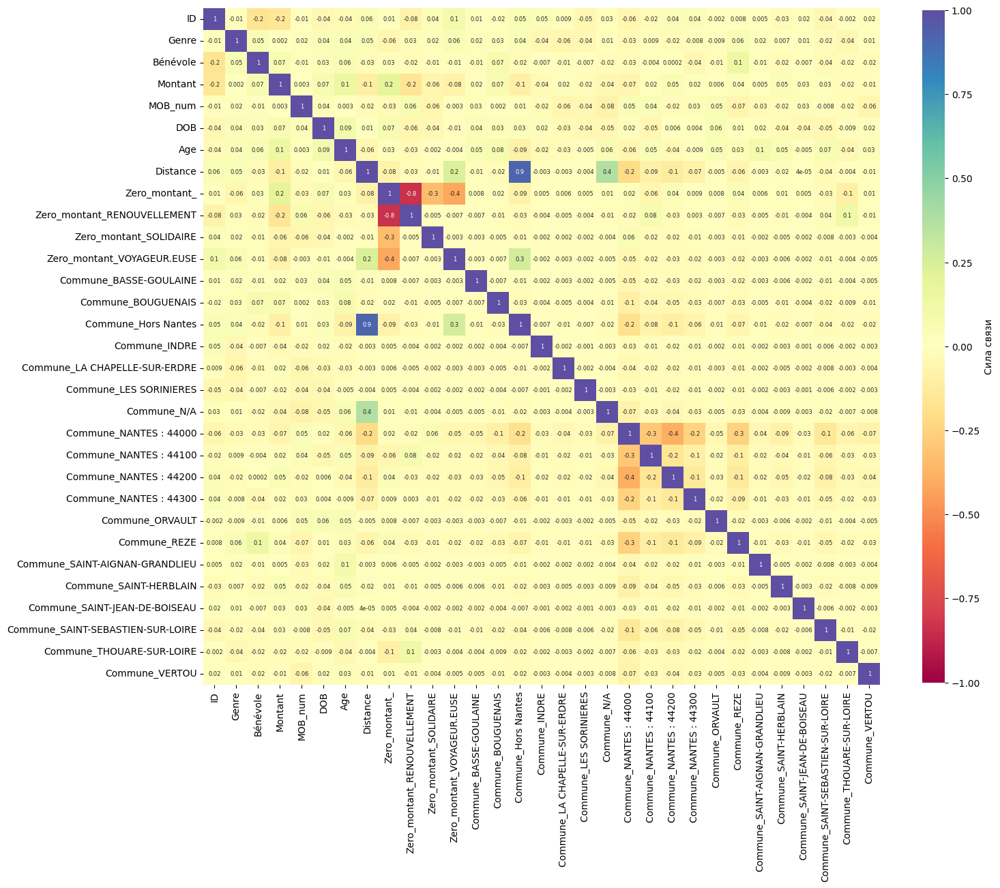

In [212]:
# Построим тепловую карту корреляции признаков
fig = plt.figure(figsize=(16, 16))
heatmap = sns.heatmap(
    data = df_ready.corr(),
    cmap = 'Spectral',
    cbar_kws = {'label':'Сила связи', 'shrink': 0.8, 'aspect': 30},
    vmin = -1.0,
    annot = True,
    fmt = '.1g',
    annot_kws = {'size': 6},
    square = True
)

> As we can see, the feature `Distance` from the center of the commune to the Atelier that we calculated correlates very strongly (+0.9) with the feature `Commune_Hors Nantes`. And, looking ahead, we can say that adding this feature to the dataframe did not affect the quality of the classification.  

### 6.1.3 Split the dataframe into validation, test, and training samples. Then, standardize 

In [213]:
# Формируем валидационную выборку (люди, которые не указали свой пол)
X_valid = df_ready[df_ready['Genre'] == 2].drop(['ID', 'Genre'], axis=1)
y_valid = df_ready[df_ready['Genre'] == 2]['Genre']

# Создаем набор предикторов и векторов
X = df_ready[df_ready['Genre'] != 2].drop(['ID', 'Genre'], axis=1)
y = df_ready[df_ready['Genre'] != 2]['Genre']

# Проверим размерности
print(X_valid.shape, y_valid.shape, X.shape, y.shape)

(80, 29) (80,) (830, 29) (830,)


In [214]:
# Разделяем выборку на тренировочную и тестовую
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=RANDOM_SEED, test_size=0.33, stratify=y)
print(X_train.shape, y_train.shape, X_test.shape, y_test.shape)

(556, 29) (556,) (274, 29) (274,)


In [216]:
# Выбираем скейлер/нормализатор
# scaler = MinMaxScaler()
scaler = Normalizer()
# scaler = StandardScaler()

# Подгоним скейлер под формат данных
scaler.fit(X_train)

# Преобразуем данные
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)
X_valid_scaled = scaler.transform(X_valid)

In [217]:
# Без скейлера
"""
X_train_scaled = X_train
X_test_scaled = X_test
X_valid_scaled = X_valid
"""

'\nX_train_scaled = X_train\nX_test_scaled = X_test\nX_valid_scaled = X_valid\n'

## 6.2. Model training

In [218]:
# Напишем функцию, выводящую значения метрик в формате датафрейма
def print_scores(message, y_train, y_train_predict,
                 y_test, y_test_predict):
    """Функция выводит на экран значения метрик качества прогноза.
    В первой версии - строчно, во второй - в виде датафрейма.

    Args:
        message (_type_): сообщение перед выводом метрик
        y_train (_type_): вектор тренировочных ответов
        y_train_predict (_type_): вектор тренировочных предсказаний
        y_test (_type_): вектор тестовых ответов
        y_test_predict (_type_): вектор тестовых предсказаний
    """  
    
    """
    # Первая версия вывода
    print('Метрика accuracy на тренировочной выборке:',
          round(metrics.accuracy_score(y_train, y_train_predict), 2))
    print('Метрика accuracy на тестовой выборке:',
          round(metrics.accuracy_score(y_test, y_test_predict), 2))
    print('Метрика precision на тестовой выборке:',
          round(metrics.precision_score(y_test, y_test_predict), 2))
    print('Метрика recall на тестовой выборке:',
          round(metrics.recall_score(y_test, y_test_predict), 2))
    print('Метрика f1_score на тестовой выборке:',
          round(metrics.f1_score(y_test, y_test_predict), 2))
    """

    # Зададим список метрик
    mets = [metrics.accuracy_score, metrics.precision_score, metrics.recall_score, metrics.f1_score]

    # Подготовим списки названий метрик, сплитов (тренировочный/тестовый) и значений
    met_names = [mets[0].__name__.split('_')[0]]
    splits = ['training']
    scores = [round(mets[0](y_train, y_train_predict), 2)]

    # Посчитаем значение каждой метрики
    for met in mets:
        met_names.append(met.__name__.split('_')[0])
        splits.append('test')
        scores.append(round(met(y_train, y_train_predict), 2))

    # Выведем на экран таблицу с сообщением
    display(message, pd.DataFrame({'Metrics': met_names, 'Splits': splits, 'Scores': scores}))

    return

### 6.2.1. Logistic Regression

In [219]:
# Создаем модель логистической регрессии
lr = linear_model.LogisticRegression(
    solver = 'sag',
    max_iter = 1000,
    random_state = RANDOM_SEED
)

# Обучаем модель
lr.fit(X_train_scaled, y_train)

# Делаем предсказание и выводим метрики качества
y_train_predict = lr.predict(X_train_scaled)
y_test_predict = lr.predict(X_test_scaled)
print_scores('Metrics for LogisticRegression',
             y_train, y_train_predict, y_test, y_test_predict)

'Metrics for LogisticRegression'

,Metrics,Splits,Scores
0,accuracy,training,0.64
1,accuracy,test,0.64
2,precision,test,0.64
3,recall,test,1.00
4,f1,test,0.78


### 6.2.2. Decision Tree Classifier

In [220]:
# Создаем модель решающие деревья
dt = tree.DecisionTreeClassifier(
    criterion = 'entropy',
    max_depth = 10,
    random_state = RANDOM_SEED
)

# Обучаем модель
dt.fit(X_train_scaled, y_train)

# Делаем предсказание и выводим метрики качества
y_train_predict = dt.predict(X_train_scaled)
y_test_predict = dt.predict(X_test_scaled)
print_scores('Metrics for DecisionTreeClassifier',
             y_train, y_train_predict, y_test, y_test_predict)

'Metrics for DecisionTreeClassifier'

,Metrics,Splits,Scores
0,accuracy,training,0.80
1,accuracy,test,0.80
2,precision,test,0.82
3,recall,test,0.89
4,f1,test,0.85


### 6.2.3. Searching Decision Tree parameters with GridSearchCV

In [259]:
# Создаем сетку перебираемых параметров
param_grid = {
    'min_samples_split': [2, 5, 7, 10], # мин. кол-во наблюдений для деления узла дерева
    'max_depth':[3, 5, 6, 7] # макс. глубина дерева
}

# Создаем модель GridSearch
gs = GridSearchCV(
    estimator = tree.DecisionTreeClassifier(
        criterion = 'entropy',
        random_state = RANDOM_SEED
    ), 
    param_grid = param_grid,
    cv = 5,
    scoring = ('f1'),
    return_train_score = True
)  

# Обучим модель
%time gs.fit(X_train_scaled, y_train)
print('Значение accuracy модели GridSearchCV на тестовой выборке:',
      round(gs.score(X_test_scaled, y_test), 2))

# Сделаем предсказания и выведем метрики качества
y_train_predict = gs.predict(X_train_scaled)
y_test_predict = gs.predict(X_test_scaled)
print('Наилучшие значения гиперпараметров:', gs.best_params_)
print_scores('Metrics for GridSearchCV with DecisionTreeClassifier',
             y_train, y_train_predict, y_test, y_test_predict)


CPU times: user 1.04 s, sys: 29.8 ms, total: 1.07 s
Wall time: 1.52 s
Значение accuracy модели GridSearchCV на тестовой выборке: 0.66
Наилучшие значения гиперпараметров: {'max_depth': 3, 'min_samples_split': 2}


'Metrics for GridSearchCV with DecisionTreeClassifier'

,Metrics,Splits,Scores
0,accuracy,training,0.66
1,accuracy,test,0.66
2,precision,test,0.72
3,recall,test,0.77
4,f1,test,0.74


### 6.2.4. Random Forest Classifier

In [257]:
# Создаем модель случайного леса
rf = ensemble.RandomForestClassifier(
    n_estimators = 100,
    criterion = 'gini',
    min_samples_leaf = 5,
    max_depth = 30,
    random_state = RANDOM_SEED
)

# Обучаем модель
# %time rf.fit(X_train_scaled, y_train)
rf.fit(X_train_scaled, y_train)

# Делаем предсказание и выводим метрики качества
y_train_predict = rf.predict(X_train_scaled)
y_test_predict = rf.predict(X_test_scaled)
print_scores('Metrics for RandomForestClassifier',
             y_train, y_train_predict, y_test, y_test_predict)

'Metrics for RandomForestClassifier'

,Metrics,Splits,Scores
0,accuracy,training,0.78
1,accuracy,test,0.78
2,precision,test,0.75
3,recall,test,0.99
4,f1,test,0.85


> We achieved the best metrics using the Random Forest Classifier model and Normalizer: prediction precision of 75% and recall of 99%. This means that the model identifies almost all males among "X" participants, but is wrong 25% of the time. Since we have only two classes: males and females, therefore 25% are females.  

## 6.3. Adding prediction into the dataframe and pdf-presentation  
We'll use the prediction made by Random Forest Classifier due to its higher metrics.

In [223]:
# Напишем функцию добвления столбца с предсказаниями в исходный датафрейм
def add_prediction(df_init, enc, model_name, model, X_valid, index) -> pd.DataFrame:
    """Функция выполняет предсказание с помощью заданной модели,
    преобразует закодированное значение в символы пола с помощью
    энкодера и добавляет столбцец в исходный датафрейм.
    Строки без прогноза содержат значение np.NaN.

    Args:
        df_init (_type_): исходный датафрейм
        enc (_type_): энкодер
        model_name (_type_): название модели (для столбца)
        model (_type_): модель предсказания
        X_valid (_type_): валидационная выборка
        index (_type_): индекс строк исходного df, для которых выполняется предсазание

    Returns:
        pd.DataFrame: _description_
    """
    
    # Выполним прогноз с помощью модели
    y_valid_pred = model.predict(X_valid)
    # Заменим кодировку на класс и преобразуем в Series с нужным индексом и именем модели
    df_toadd = pd.Series(enc.inverse_transform(y_valid_pred), index=index, name='Gen^'+model_name)
    # Добавим прогноз в исходный датафрейм
    df_final = df_init.join(other=df_toadd, on=df_init.index, how='left')
    # Вернем результат
    return df_final

In [ ]:
# Отладочные строки удаления добавленных столбцов при дополнительных тестах
# df_class.drop(['Gen^lr', 'Gen^dt', 'Gen^gs', 'Gen^rf'], axis=1, inplace=True)
# df_class['Genre'] = le.transform(df_class['Genre'])

In [268]:
# Зададим словарь обученных моделей
models = {'lr': lr, 'dt': dt, 'gs': gs, 'rf': rf}

# Добавим предсказания всех моделей в датафрейм
for m_name, model in models.items():
    df_class = add_prediction(df_init=df_class,
                            enc=le,
                            model_name=m_name,
                            model=model,
                            X_valid=X_valid_scaled,
                            index=y_valid.index)

# В датафрейме также преобразуем кодировки полов
df_class['Genre'] = le.inverse_transform(df_class['Genre'])
df_class.sample(5)

,ID,Genre,Bénévole,Montant,MOB_num,DOB,Age,Zero_montant,Distance,Commune,Gen^lr,Gen^dt,Gen^gs,Gen^rf
,,,,,,,,,,,,,,
318,319,F,0,10,8.0,12.0,25.0,,2.35,NANTES : 44000,NaN,NaN,NaN,NaN
645,646,H,0,2,1.0,1.0,27.0,,2.35,NANTES : 44300,NaN,NaN,NaN,NaN
533,534,F,0,10,7.0,4.0,28.0,,2.35,NANTES : 44000,NaN,NaN,NaN,NaN
380,381,F,0,10,9.0,22.0,25.0,,2.35,NANTES : 44200,NaN,NaN,NaN,NaN
569,570,H,0,15,4.0,9.0,30.0,,2.35,NANTES : 44000,NaN,NaN,NaN,NaN


In [269]:
# Выведем на экран часть датафрейма с предсказаниями
df_predictions = df_class[df_class.iloc[:, -1].isna() == False]
df_predictions

,ID,Genre,Bénévole,Montant,MOB_num,DOB,Age,Zero_montant,Distance,Commune,Gen^lr,Gen^dt,Gen^gs,Gen^rf
,,,,,,,,,,,,,,
21,22,X,1,10,10.0,25.0,33.0,,2.35,NANTES : 44200,H,H,H,H
33,34,X,0,10,11.0,16.0,37.0,,2.35,NANTES : 44000,H,F,H,H
34,35,X,1,10,11.0,26.0,36.0,,2.35,NANTES : 44000,H,H,H,H
37,38,X,1,20,3.0,23.0,41.0,,3.90,REZE,H,H,H,H
41,42,X,0,20,9.0,20.0,33.0,,2.35,NANTES : 44000,H,H,H,H
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
926,927,X,0,0,2.0,22.0,25.0,,2.35,NANTES : 44000,H,F,F,F
948,949,X,0,5,11.0,26.0,37.0,,2.35,NANTES : 44000,H,H,H,H
961,962,X,0,15,11.0,26.0,42.0,,2.35,NANTES : 44300,H,H,H,H


In [270]:
# Подготовим список ID с предсказанным полом для отображения в презентации
output = pd.DataFrame(dtype='object')

# Поскольку таких записей всего 80, разделим их на 4 колонки по 20
# Будем добавлять предсказания модели RandomForestClassifier - последний столбец
for i in range(0, 71, 20):
    output = pd.concat([output, df_predictions.iloc[i:i+20, [0, -1]].reset_index(drop=True)], axis=1)

display('Genre prédit des participants', output)

'Genre prédit des participants'

,ID,Gen^rf,ID,Gen^rf,ID,Gen^rf,ID,Gen^rf
0,22,H,176,H,443,H,709,H
1,34,H,184,H,477,H,724,F
2,35,H,197,H,479,H,760,H
3,38,H,222,H,489,H,764,F
4,42,H,244,H,491,H,793,H
5,53,H,261,H,492,H,817,H
6,55,H,266,H,495,H,829,H
7,65,H,272,H,525,H,832,H
8,69,H,299,H,545,H,841,H
9,90,H,308,F,549,H,864,F


Plotting the predicted proportion of men and women (for the presentation only)

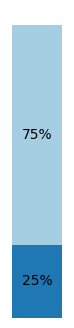

In [329]:
# Построение графика предсказанной доли мужчин и женщин (только для презентации)
pours = [25, 75]
fig = plt.figure(figsize=(0.7,4))

p1 = plt.bar(1, pours[0], color=GENRE_COLORS['F'])
p2 = plt.bar(1, pours[1], bottom=pours[0], color=GENRE_COLORS['H'])

plt.xticks([], [])
plt.yticks([], [])
plt.bar_label(p1, label_type='center', fmt='%.0f%%')
plt.bar_label(p2, label_type='center', fmt='%.0f%%')

for pos in ['right', 'top', 'bottom', 'left']: 
    plt.gca().spines[pos].set_visible(False) 

plt.show()

___
# Project conclusions   
We analyzed the Atelier du Pignon database for the years 2023-2024 and, despite the relatively small number of records (979) and the sparse set of attributes managed to draw an overall picture for all participants, as well as formulate and illustrate certain patterns and answer the questions posed.   
1. We determined the contribution of each of the communes of Nantes by the number of participants, volunteers and fees collected.  
2. Demonstrated the dependence of the size of the fee on the participant's gender and volunteer status, as well as the month of birth. 
3. We illustrated the findings not only with graphs, but also on an interactive map of the city, ensuring visual clarity.  
4. We also analyzed the current year's forming database (2024-2025) as of the end of November with 326 enrolled participants and showed trends compared to the previous year.  

In the final, 6th part of the project, we took on additional labor and solved a Data Science problem that was not initially set by the Atelier management, namely: predicting the gender of those participants who did not indicate it in the questionnaire for various reasons. We were interested in confirming or refuting the hypotheses formulated in the process of analysis.  

Finally, we formalized the results of the work into a report presentation in pdf format.  

Note that additional models could be used to solve the problem of gender classification and prediction. Although due to the lack of a significant number of independent features, as well as the small size of the database, we cannot expect radically different values of metrics.  

In the future, it would be interesting to follow the evolution of the composition of the participants as we described in paragraph 4 by performing these analyses on an annual basis. Anyway, **this analysis, performed** by us (one of the Atelier's participants) **on a voluntary basis**, has already allowed for better understanding of the Atelier's audience.  


### [RU-version] Выводы по проекту
Мы проанализировали базу данных Atelier du Pignon за 2023-2024 год и, несмотря на сравнительно небольшое количество записей (979) и скудный набор признаков сумели составить общую картину по всем участникам, а также сформулировать и проиллюстрировать определенные закономерности, ответить на поставленные вопросы.   
1. Мы определили вклад каждой из коммун Нанта по числу участников, добровольцев и собранных взносов.  
2. Продемонстрировали зависимость размера взноса от пола участника и его статуса добровольца, а также месяца рождения. 
3. Проиллюстрировали выводы не только с помощью графиков, но и на интерактивной карте города, обеспечив наглядность.  
4. Мы также проанализировали формирующуюся базу данных текущего года (2024-2025) по состоянию на конец ноября с 326 записавшимися участниками и показали динамику в сравнении с предыдущим годом.  

В финальной, 6-й части, проекта мы взяли на себя дополнительный труд и решили задачу Data Science, которая изначально не ставилась руководством Ателье, а именно: предсказание пола тех участников, которые не указали его в анкете по разным причинам. Нам было интересно подтвердить или опровергнуть гипотезы, сформулированные в процессе анализа.  

Наконец, результаты работы мы оформили в отчетную презентацию в формате pdf.  

Заметим, что для решения задачи классификации и предсказания пола, можно было бы использовать дополнительные модели. Хотя из-за отсутствия значительного числа независимых признаков, как и малоразмерность базы данных, рассчитывать на кардинально отличающиеся значения метрик не приходится.  

В дальнейшем было бы интересно проследить эволюцию состава участников, как мы это описали в 4-м пункте, выполняя анализ данных на ежегодной основе. Так или иначе, данный анализ, выполненный нами (одними из участников Ателье) на добровольной основе, уже позволил лучше понять аудиторию Ателье.  